# import package

In [1]:
# Importing necessary modules
from SigMT import mtproc, var, data_sel, tipper, mahaDist, plotting,plot_coherency,plot_data,plot_pd,plotMD
import config
from scipy import signal
import time
import math
import re
import scipy.interpolate
from scipy import signal,interpolate
from scipy.fft import fft
import numpy as np
from datetime import datetime as dt
from tqdm import tqdm

%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator,MultipleLocator,FormatStrFormatter
import matplotlib.ticker as mtick

# 忽略警告
import warnings
warnings.filterwarnings('ignore')
# 显示指数数字
import matplotlib as mpl
mpl.rcParams.update({'text.usetex': False,'font.family': 'stixgeneral','mathtext.fontset': 'stix'})

# from razorback.io.tsn import *
from razorback_v04.io.tsn import *
from fourier_transform import slepian_window
# from razorback_v04.calibrations import phonex_Ex,phonex_Ey,magnetic_channels_calib
import razorback as rb
import razorback_v04 as rb_v04

from argparse import ArgumentParser
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# load data

## load orignal data

In [2]:
file_path = "/home/enhuaj/data/AMT/"
place = '贵州_site101_102040U1'
calib_file = ["CM4C1106_2","CM4C1114_2"]
# 标定路径
Province = place.split('_')[0]
site = place.split('_')[1]
file = place.split('_')[2]
filename_TS2 = os.path.join(file_path,"{}/{}/时间序列/{}.TS2".format(Province,site,file))
filename_TS3 = os.path.join(file_path,"{}/{}/时间序列/{}.TS3".format(Province,site,file))
filename_TS4 = os.path.join(file_path,"{}/{}/时间序列/{}.TS4".format(Province,site,file))
# 标定路径
choppdataHx = os.path.join(file_path,"{}/{}/标定/{}.txt".format(Province,site,calib_file[0]))
choppdataHy = os.path.join(file_path,"{}/{}/标定/{}.txt".format(Province,site,calib_file[1]))

TS2 = load_tsn(filename_TS2, calibrations=None, lazy=False)
TS3 = load_tsn(filename_TS3, calibrations=None, lazy=False)
TS4 = load_tsn(filename_TS4, calibrations=None, lazy=False)

TS2_Ex = np.hstack((TS2.signals[i].data[0] for i in range(len(TS2.sizes)))) * 2.98e-7 * 1e3  # mv/m
TS2_Ey = np.hstack((TS2.signals[i].data[1] for i in range(len(TS2.sizes)))) * 2.98e-7 * 1e3    
TS2_Hx = np.hstack((TS2.signals[i].data[2] for i in range(len(TS2.sizes)))) * 2.98e-7 * 1e3  # mv/nt
TS2_Hy = np.hstack((TS2.signals[i].data[3] for i in range(len(TS2.sizes)))) * 2.98e-7 * 1e3   
TS3_Ex = np.hstack((TS3.signals[i].data[0] for i in range(len(TS3.sizes)))) * 2.98e-7 * 1e3  # mv/m
TS3_Ey = np.hstack((TS3.signals[i].data[1] for i in range(len(TS3.sizes)))) * 2.98e-7 * 1e3    
TS3_Hx = np.hstack((TS3.signals[i].data[2] for i in range(len(TS3.sizes)))) * 2.98e-7 * 1e3  # mv/nt
TS3_Hy = np.hstack((TS3.signals[i].data[3] for i in range(len(TS3.sizes)))) * 2.98e-7 * 1e3  
TS4_Ex = np.hstack((TS4.signals[i].data[0] for i in range(len(TS4.sizes)))) * 2.98e-7 * 1e3  # mv/m
TS4_Ey = np.hstack((TS4.signals[i].data[1] for i in range(len(TS4.sizes)))) * 2.98e-7 * 1e3    
TS4_Hx = np.hstack((TS4.signals[i].data[2] for i in range(len(TS4.sizes)))) * 2.98e-7 * 1e3  # mv/nt
TS4_Hy = np.hstack((TS4.signals[i].data[3] for i in range(len(TS4.sizes)))) * 2.98e-7 * 1e3  

<class 'list'>
<class 'list'>
<class 'list'>


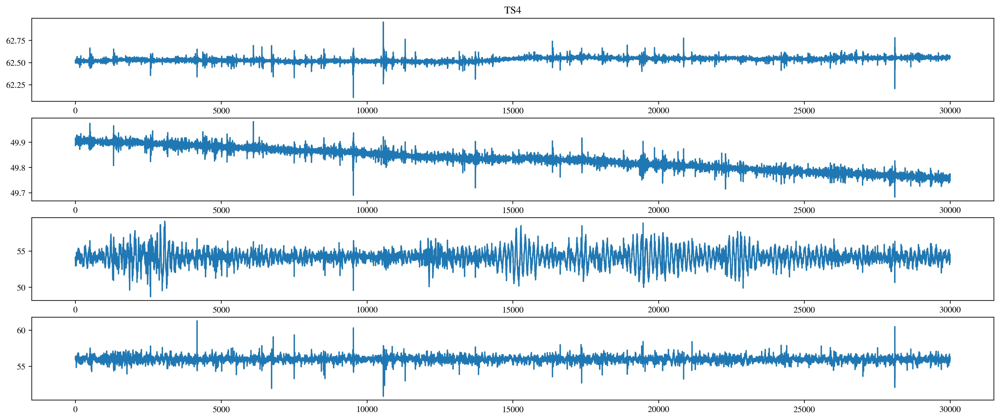

In [3]:
def plot_time_series(ts,start,end,title):
    plt.figure(figsize=(20,8),dpi=300)
    plt.subplot(411)
    plt.plot(ts[list(ts.keys())[0]][start:end])
    plt.title(title)
    plt.subplot(412)
    plt.plot(ts[list(ts.keys())[1]][start:end])
    plt.subplot(413)
    plt.plot(ts[list(ts.keys())[2]][start:end])
    plt.subplot(414)
    plt.plot(ts[list(ts.keys())[3]][start:end])
     
start,end = 170000,200000
ts = {'tsEx':TS4_Ex,'tsEy':TS4_Ey,'tsHx':TS4_Hx,'tsHy':TS4_Hy}
plot_time_series(ts,start,end,'TS4')
del ts

## load denoised data(TS4)

In [4]:
# def parse_args_test():
#     """Command-line argument parser for testing."""

#     # New parser
#     parser = ArgumentParser(description='Test_params')

#     # Data parameters
#     parser.add_argument('--root_dir', default='/home/enhuaj/denoise/N2N-pytorch/', help='the root directory of the entire project')
#     parser.add_argument('--site_dir',default='/home/enhuaj/denoise/N2N-pytorch/data/', help='training set path')
#     parser.add_argument('--mode', default='test', help='test')
#     parser.add_argument('--site_name', default='site101', help='name of one site(test)')
#     parser.add_argument('--data_name', default='102020U1', help='name of one site one channel data(test)')
#     parser.add_argument('--channel', default='Ex', help='Ex, Ey, Hx or Hy')
#     parser.add_argument('--size', default=3200, type=int, help='single sample window size')
#     parser.add_argument("--norm", type=str, default='mea_std_norm', help="norm type ['mea_std_norm','min_std_norm','mean_norm']")
    
#     parser.add_argument('--load-ckpt', default='/home/enhuaj/denoise/N2N-pytorch/ckpts/noclean-0920-1516/n2n-epoch21-loss0.010-snr19.396.pt', help='load model checkpoint')
#     parser.add_argument('--show-output', help='display (n) prediction results and save them in the "./denoised" folder', default=10, type=int)
#     parser.add_argument('--cuda', help='use cuda', action='store_true')

#     # Corruption parameters
#     parser.add_argument('-s', '--seed', help='fix random seed', type=int)

#     return parser.parse_known_args()[0]

# # Parse test parameters
# params_t = parse_args_test()
# params_t.channel = 'Hx'
# params_t.data_name = file # '102020U1'
# params_t.load_ckpt = '../N2N-pytorch/ckpts/noclean-1010-2322/n2n-epoch10-loss0.005-snr23.280.pt'
# params_t.cuda = True
# img_name = params_t.data_name + params_t.channel

In [5]:
# # read data
# denorm = True
# diff_count = '0'
# params_t.data_name = '102040U1'
# if denorm:
#     save_path = os.path.join(params_t.root_dir, 'result', params_t.site_name, 'denorm')
# else:
#     save_path = os.path.join(params_t.root_dir, 'result', params_t.site_name)
    
# source_data = []
# denoised_data = []
# diff = []
# for c in ['Ex','Ey','Hx','Hy']:
#     if denorm:
#         source_filename = '{}_{}_source{}_denorm.npy'.format(params_t.data_name,c,diff_count)
#         denoised_filename = '{}_{}_denoised{}_denorm.npy'.format(params_t.data_name,c,diff_count)
#         diff_filename = '{}_{}_diff{}_denorm.npy'.format(params_t.data_name,c,diff_count)
#     else:
#         source_filename = '{}_{}_source{}.npy'.format(params_t.data_name,c,diff_count)
#         denoised_filename = '{}_{}_denoised{}.npy'.format(params_t.data_name,c,diff_count)
#         diff_filename = '{}_{}_diff{}.npy'.format(params_t.data_name,c,diff_count)
        
#     source_filepath = os.path.join(save_path, source_filename)
#     denoised_filepath = os.path.join(save_path, denoised_filename)
#     diff_filepath = os.path.join(save_path, diff_filename)

#     s = np.load(source_filepath ,allow_pickle=True)
#     d = np.load(denoised_filepath ,allow_pickle=True)
#     di = np.load(diff_filepath ,allow_pickle=True)
    
#     source_data.append(s)
#     denoised_data.append(d)
#     diff.append(di)

In [6]:
# start,end = 0,300000
# ts = {'tsEx':diff[0],'tsEy':diff[1],'tsHx':diff[2],'tsHy':diff[3]}
# plot_time_series(ts,start,end,'TS2')
# del ts

In [4]:
TS4_Ex_denoise = np.load('result/{}/denorm/{}_Ex_diff0_denorm.npy'.format(site,file),allow_pickle=True)
TS4_Ey_denoise = np.load('result/{}/denorm/{}_Ey_diff0_denorm.npy'.format(site,file),allow_pickle=True)
TS4_Hx_denoise = np.load('result/{}/denorm/{}_Hx_diff0_denorm.npy'.format(site,file),allow_pickle=True)
TS4_Hy_denoise = np.load('result/{}/denorm/{}_Hy_diff0_denorm.npy'.format(site,file),allow_pickle=True)

## load clean part data

In [5]:
s_id,e_id = 170000,200000# 手动索引
ss,ee = s_id/len(TS4_Ex),e_id/len(TS4_Ex) # 百分比

windowlen3 = 1024
id2 = [int(ss*len(TS2_Ex)),int(ee*len(TS2_Ex))]
id3 = [int(ss*len(TS3_Ex)/windowlen3)*windowlen3,int(ee*len(TS3_Ex)/windowlen3)*windowlen3]

TS2_Ex_c = TS2_Ex[id2[0]:id2[1]]
TS2_Ey_c = TS2_Ey[id2[0]:id2[1]]
TS2_Hx_c = TS2_Hx[id2[0]:id2[1]]
TS2_Hy_c = TS2_Hy[id2[0]:id2[1]]  
TS3_Ex_c = TS3_Ex[id3[0]:id3[1]]
TS3_Ey_c = TS3_Ey[id3[0]:id3[1]]
TS3_Hx_c = TS3_Hx[id3[0]:id3[1]]
TS3_Hy_c = TS3_Hy[id3[0]:id3[1]]  
TS4_Ex_c = TS4_Ex[s_id:e_id]
TS4_Ey_c = TS4_Ey[s_id:e_id]
TS4_Hx_c = TS4_Hx[s_id:e_id]
TS4_Hy_c = TS4_Hy[s_id:e_id] 

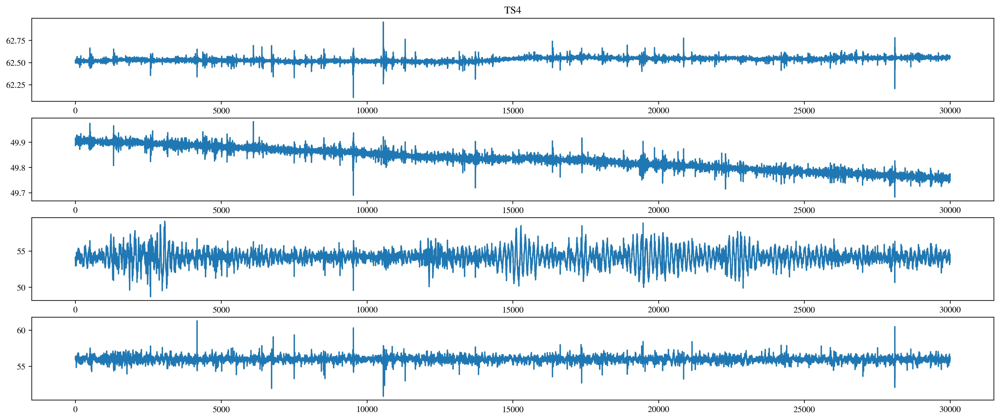

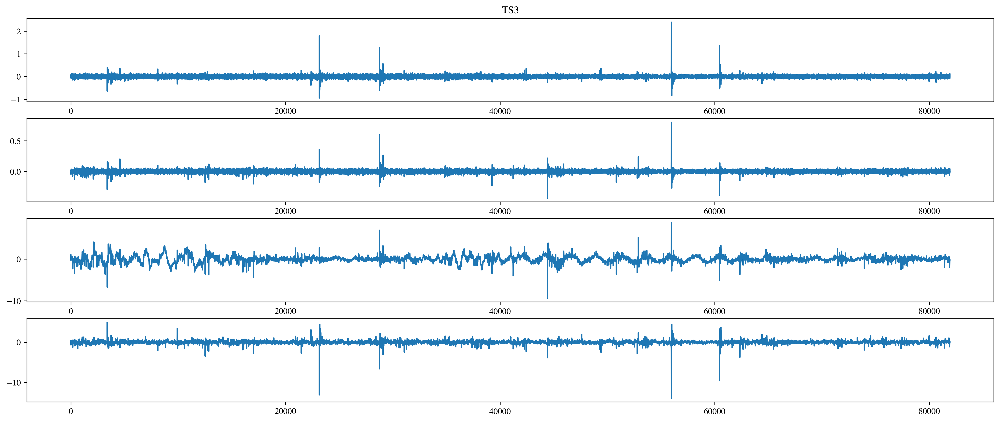

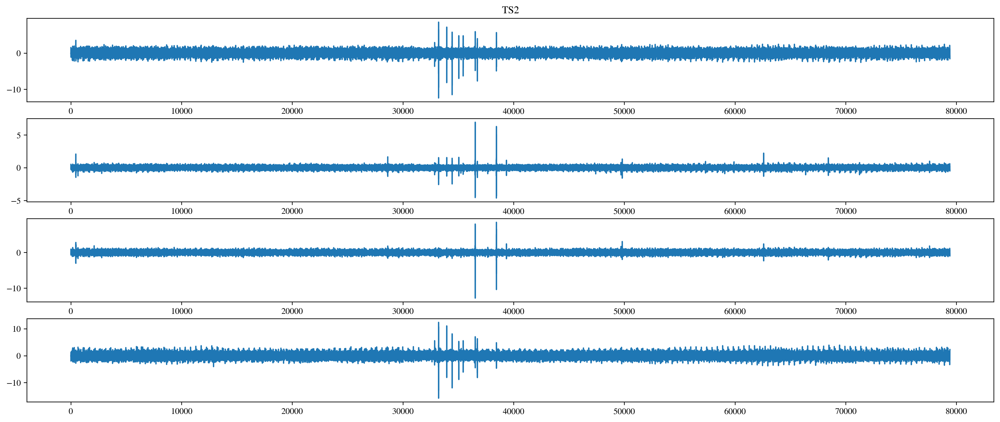

In [6]:
# check clean part TS4 time seriers
ts = {'Ex':TS4_Ex_c,'Ey':TS4_Ey_c,'Hx':TS4_Hx_c,'Hy':TS4_Hy_c}
plot_time_series(ts,0,len(TS4_Ex_c),'TS4')
del ts
# check clean part TS3 time seriers
ts = {'Ex':TS3_Ex_c,'Ey':TS3_Ey_c,'Hx':TS3_Hx_c,'Hy':TS3_Hy_c}
plot_time_series(ts,0,len(TS3_Ex_c),'TS3')
del ts
# check clean part TS2 time seriers
ts = {'Ex':TS2_Ex_c,'Ey':TS2_Ey_c,'Hx':TS2_Hx_c,'Hy':TS2_Hy_c}
plot_time_series(ts,0,len(TS2_Ex_c),'TS2')
del ts

## **Plot power spectrum (TS4)**

In [7]:
def plot_psd(data,title,Fs):
    
    plt.figure(figsize=(20,5),dpi=300)
    if Fs==150:
        plt.psd(data[0], NFFT=32768, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(32768))
        plt.psd(data[1], NFFT=32768, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(32768))
        plt.psd(data[2], NFFT=32768, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(32768))
        plt.psd(data[3], NFFT=32768, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(32768))
    elif Fs==2400:
        plt.psd(data[0], NFFT=4096, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(4096))
        plt.psd(data[1], NFFT=4096, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(4096))
        plt.psd(data[2], NFFT=4096, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(4096))
        plt.psd(data[3], NFFT=4096, Fs=Fs,detrend='linear',noverlap=0,window=np.hanning(4096))    
    elif Fs==24000:
        plt.psd(data[0], NFFT=2048, Fs=Fs,detrend='linear',noverlap=0.84,window=np.hanning(2048))
        plt.psd(data[1], NFFT=2048, Fs=Fs,detrend='linear',noverlap=0.84,window=np.hanning(2048))
        plt.psd(data[2], NFFT=2048, Fs=Fs,detrend='linear',noverlap=0.84,window=np.hanning(2048))
        plt.psd(data[3], NFFT=2048, Fs=Fs,detrend='linear',noverlap=0.84,window=np.hanning(2048))
        
    plt.semilogx()
    plt.legend(['Ex','Ey','Hx','Hy'],loc='lower left')
    plt.xlim(0,Fs/2)
    plt.xlabel('Frequency(Hz)',fontsize = 15)
    plt.title(title+' (fs={}Hz)'.format(str(Fs)),fontsize = 15)

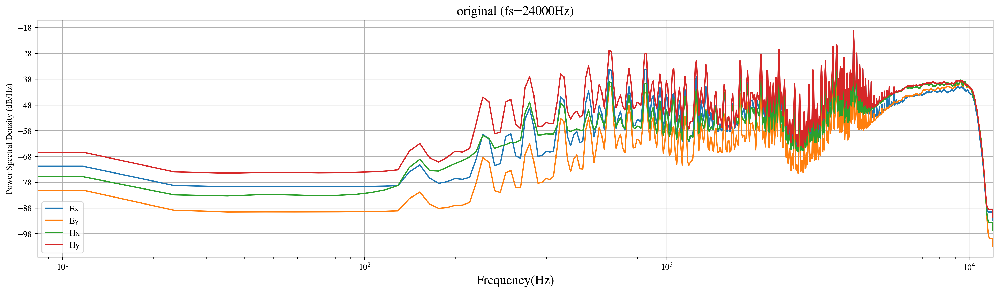

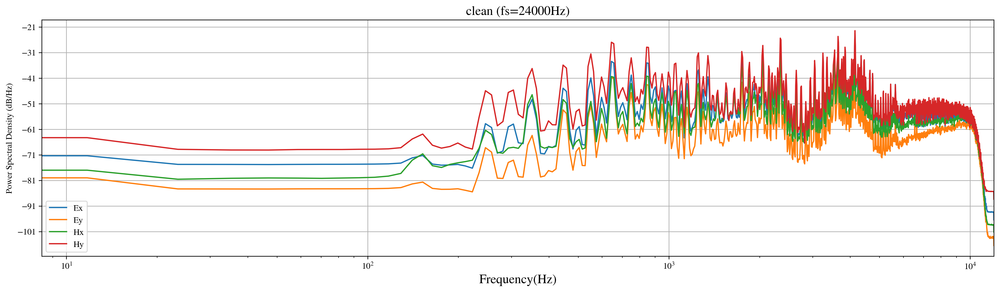

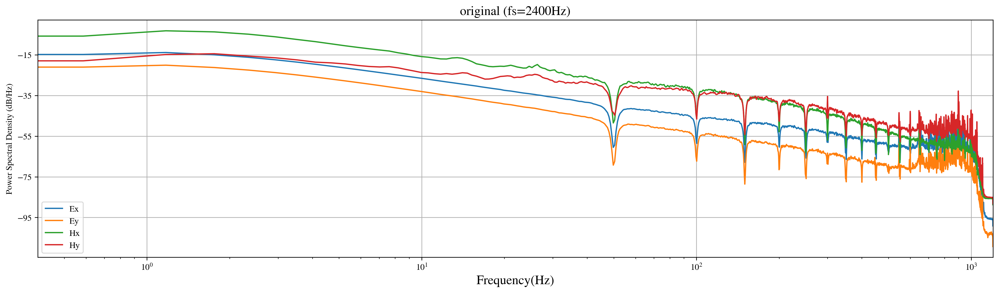

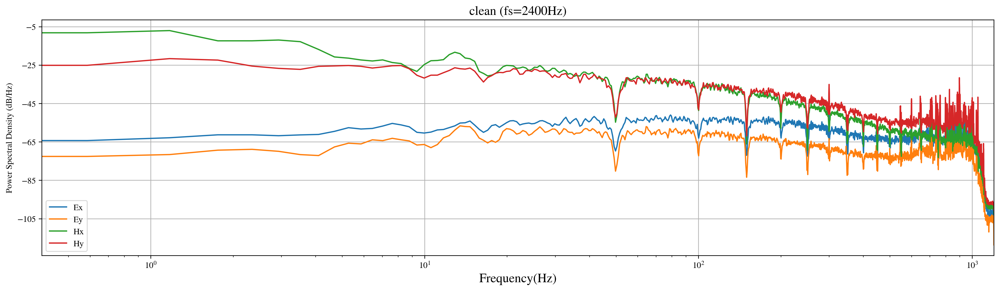

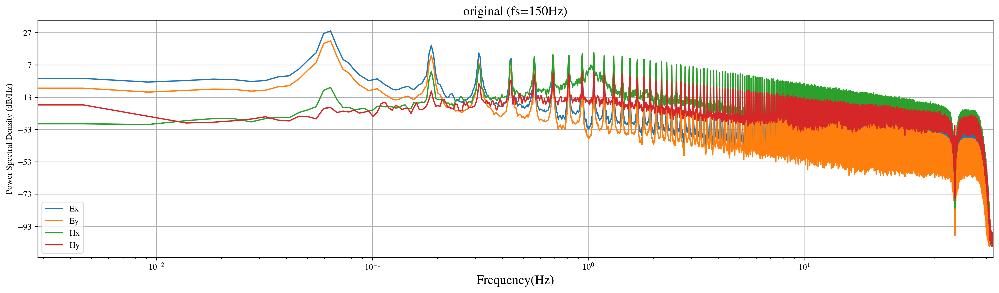

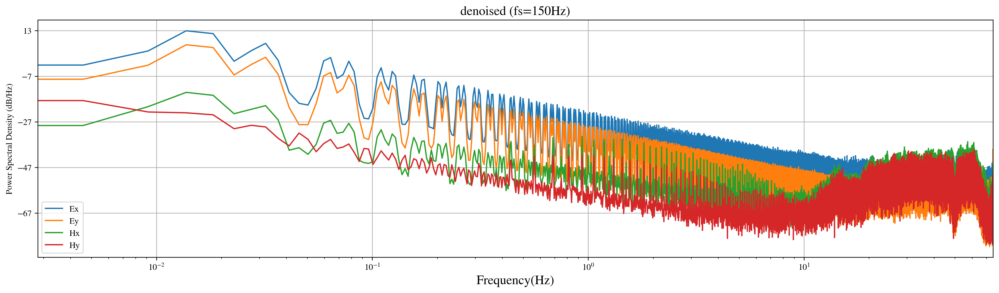

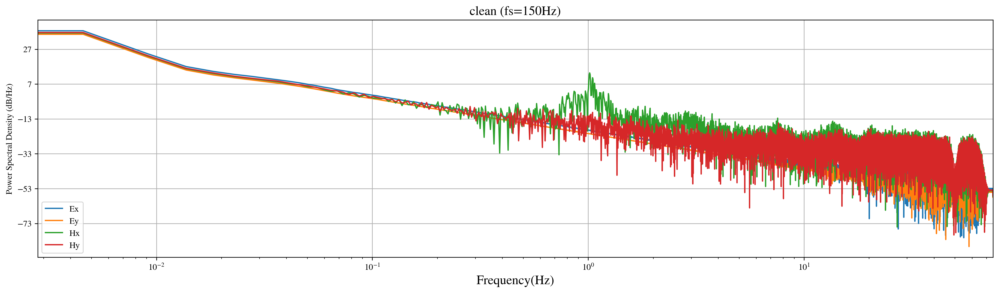

In [8]:
# TS2
plot_psd([TS2_Ex,TS2_Ey,TS2_Hx,TS2_Hy],'original',24000)
# plot_psd([TS2_Ex_denoise,TS2_Ey_denoise,TS2_Hx_denoise,TS2_Hy_denoise],'denoised',24000) # TO DO
plot_psd([TS2_Ex_c,TS2_Ey_c,TS2_Hx_c,TS2_Hy_c],'clean',24000)
# TS3
plot_psd([TS3_Ex,TS3_Ey,TS3_Hx,TS3_Hy],'original',2400)
# plot_psd([TS3_Ex_denoise,TS3_Ey_denoise,TS3_Hx_denoise,TS3_Hy_denoise],'denoised',2400) # TO DO
plot_psd([TS3_Ex_c,TS3_Ey_c,TS3_Hx_c,TS3_Hy_c],'clean',2400)
# TS4
plot_psd([TS4_Ex,TS4_Ey,TS4_Hx,TS4_Hy],'original',150)
plot_psd([TS4_Ex_denoise,TS4_Ey_denoise,TS4_Hx_denoise,TS4_Hy_denoise],'denoised',150)
plot_psd([TS4_Ex_c,TS4_Ey_c,TS4_Hx_c,TS4_Hy_c],'clean',150)

# TS2

In [9]:
def main_TS2(ts,procinfo,config,factor=1e4):
    
    global site,file
    
    print('--------------------')
    print('MT site: ',procinfo['selectedsite'])
    print('Measurement directory: ',procinfo['meas'])
    print('fs= ', str(procinfo.get('fs')) +' Hz')
    print('Sensor numbers:',procinfo.get('sensor_no'))# 这里的序列号是用来寻找标定文件.txt的
    print('Calib filles:',procinfo.get('cal_path'))
    print('Length of time series = ',str(procinfo.get('nofs')))
    print('--------------------')
    print('\nWindow Length selected: ', str(procinfo.get('WindowLength')))
    print('Time series overlap: ', str(procinfo.get('overlap'))+'%')
    print('No. of windows: ',str(procinfo.get('nstacks')))
    print('--------------------')
    #==================== Start band averaging ====================
    # No need to edit
    # Band average value after calibration and averaging using parzen window
    ftlist2,bandavg2 = mtproc.bandavg_Tsn(ts,procinfo,config,factor) # ftlist:(频率数) bandavg:dict，包含自/互功率谱数据
    #
    #==================== Band averaging finished =================
    cohMatrixEx = np.ones(np.shape(bandavg2.get('ExExc')),dtype=float) # (13, 1445)
    cohMatrixEy = np.ones(np.shape(bandavg2.get('ExExc')),dtype=float)
    pdmat = np.ones(np.shape(bandavg2.get('ExExc')),dtype=float)
    # Calculation of coherency values for all time windows
    AllcohEx = data_sel.cohEx(bandavg2) # (13, 1445)
    AllcohEy = data_sel.cohEy(bandavg2) # (13, 1445)
    # Calculation of polarization directions for all time windows
    alpha_degH,alpha_degE = data_sel.pdvalues(bandavg2) # (13, 1445)

    #====== Coherency threshold ======
    ctflag = 0 # Give '1' to perform coherency threshold based selection
    if ctflag == 1:
        CohThre = [0.9] * np.shape(AllcohEx)[0] # 相干性阈值范围 
        for i in range(np.shape(AllcohEx)[0]):
            for j in range(np.shape(AllcohEx)[1]):
                if AllcohEx[i,j] < CohThre[i]: # 同一频点，Ex第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEx[i,j] = 0
                else:
                    cohMatrixEx[i,j] = 1
                if AllcohEy[i,j] < CohThre[i]: # 同一频点，Ey第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEy[i,j] = 0
                else:
                    cohMatrixEy[i,j] = 1
    #
    #====== Polarization direction ======
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        pdlim = [-10,10] # 方法一：极化方向范围
        alpha = alpha_degE # Use either alpha_degE or alpha_degH 用其中一个极化方向进行阈值选择数据
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if alpha[i,j] > pdlim[0] and alpha[i,j] < pdlim[1]: # 同一频点，电场极化方向在拒绝极化方向范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1
    #            
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        timewindow_limits = [0,5] #方法二： 时间窗范围
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if j > timewindow_limits[0] and j < timewindow_limits[1]: # 同一频点，时间窗位置索引在拒绝时间窗索引范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1

                    # cohMatrix*起到利用相干性挑选质量好的数据的作用，mask1
    # pdmat起到利用极化方向挑选质量好的数据的作用（有两种方法：极化范围 and 时间窗，可以同时使用两种方法） mask2
    bandavg2['cohMatrixEx'] = cohMatrixEx 
    bandavg2['cohMatrixEy'] = cohMatrixEy
    bandavg2['pre_sel_matEx'] = cohMatrixEx * pdmat # 同时满足mask1 和 mask2来挑选质量好的数据
    bandavg2['pre_sel_matEy'] = cohMatrixEy * pdmat
    bandavg2['mdmatrixEx'],bandavg2['Zxx_mcd'],bandavg2['Zxy_mcd'],bandavg2['mahal_robustEx'] = mahaDist.mcd(bandavg2,'Ex',config) # 计算马氏距离
    bandavg2['mdmatrixEy'],bandavg2['Zyx_mcd'],bandavg2['Zyy_mcd'],bandavg2['mahal_robustEy'] = mahaDist.mcd(bandavg2,'Ey',config)
    bandavg2['selectedEx'] = bandavg2.get('mdmatrixEx')
    bandavg2['selectedEy'] = bandavg2.get('mdmatrixEy')
    bandavg2['avgt'] = np.sum((bandavg2.get('selectedEx'))!=0,axis=1)
    Z_huber2 = mtproc.perform_robust(ftlist2,bandavg2)

    #==================== Calculation of variance ===================
    Zvar2 = {}
    Zvar2['xx'],Zvar2['xy'],cohEx2 = var.ZExvar(Z_huber2,bandavg2)
    Zvar2['yx'],Zvar2['yy'],cohEy2 = var.ZEyvar(Z_huber2,bandavg2)

    plotting.plotfigs(ftlist2, Z_huber2, Zvar2, cohEx2, cohEy2)
    return ftlist2,bandavg2,Z_huber2,Zvar2, cohEx2, cohEy2

## 原始时序

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  24000 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  816000
--------------------

Window Length selected:  4096
Time series overlap:  50%
No. of windows:  199
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 16/16 [00:01<00:00,  8.64it/s]



Computing Jackknife estimate....ft = 10400.0

Computing Jackknife estimate....ft = 8707.0

Computing Jackknife estimate....ft = 7289.0

Computing Jackknife estimate....ft = 6102.0

Computing Jackknife estimate....ft = 5108.0

Computing Jackknife estimate....ft = 4277.0

Computing Jackknife estimate....ft = 3580.0

Computing Jackknife estimate....ft = 2997.0

Computing Jackknife estimate....ft = 2509.0

Computing Jackknife estimate....ft = 2101.0

Computing Jackknife estimate....ft = 1759.0

Computing Jackknife estimate....ft = 1472.0

Computing Jackknife estimate....ft = 1233.0

Computing Jackknife estimate....ft = 1032.0

Computing Jackknife estimate....ft = 863.9

Computing Jackknife estimate....ft = 723.2
Finished.

Computing Huber estimate....ft = 10400.0

Computing Huber estimate....ft = 8707.0

Computing Huber estimate....ft = 7289.0

Computing Huber estimate....ft = 6102.0

Computing Huber estimate....ft = 5108.0

Computing Huber estimate....ft = 4277.0

Computing Huber estimat

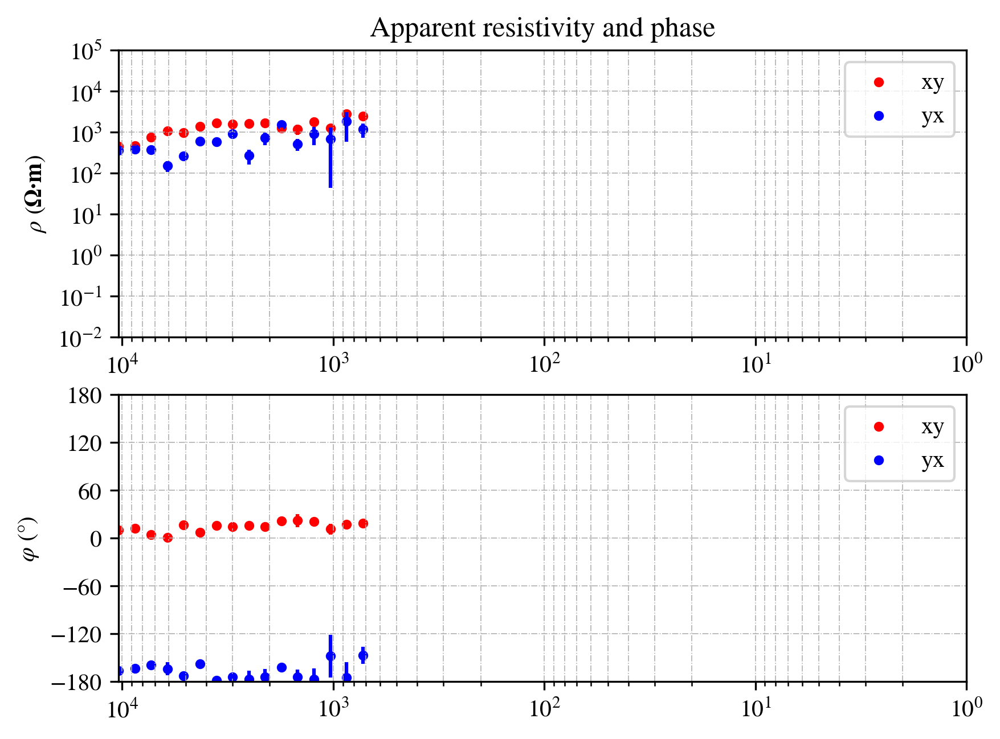

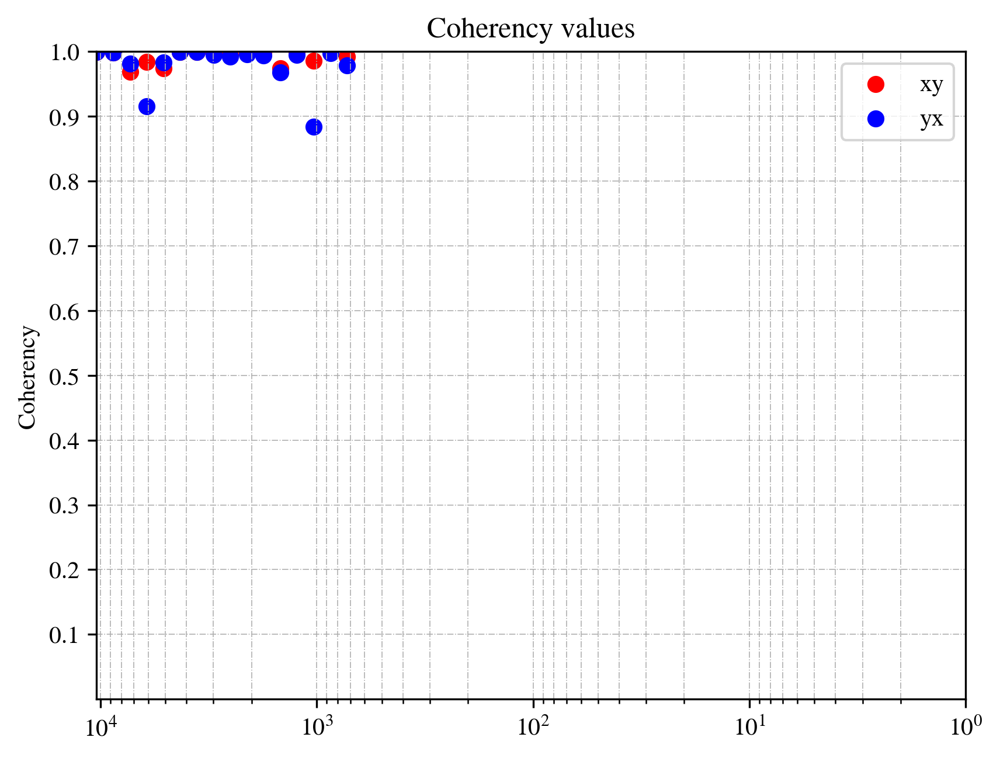

In [10]:
ts2 = {}
ts2['tsEx'] = TS2_Ex
ts2['tsEy'] = TS2_Ey 
ts2['tsHx'] = TS2_Hx
ts2['tsHy'] = TS2_Hy

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = 24000 # 24000,2400,150
procinfo['level'] = 2 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts2['tsEx'])
procinfo['notch'] = 1 # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 50 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist2_o,bandavg2_o,Z_huber2_o,Zvar2_o,cohEx2_o,cohEy2_o = main_TS2(ts2,procinfo,config)

## 去噪后

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  24000 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  816000
--------------------

Window Length selected:  4096
Time series overlap:  50%
No. of windows:  199
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 16/16 [00:01<00:00,  8.34it/s]



Computing Jackknife estimate....ft = 10400.0

Computing Jackknife estimate....ft = 8707.0

Computing Jackknife estimate....ft = 7289.0

Computing Jackknife estimate....ft = 6102.0

Computing Jackknife estimate....ft = 5108.0

Computing Jackknife estimate....ft = 4277.0

Computing Jackknife estimate....ft = 3580.0

Computing Jackknife estimate....ft = 2997.0

Computing Jackknife estimate....ft = 2509.0

Computing Jackknife estimate....ft = 2101.0

Computing Jackknife estimate....ft = 1759.0

Computing Jackknife estimate....ft = 1472.0

Computing Jackknife estimate....ft = 1233.0

Computing Jackknife estimate....ft = 1032.0

Computing Jackknife estimate....ft = 863.9

Computing Jackknife estimate....ft = 723.2
Finished.

Computing Huber estimate....ft = 10400.0

Computing Huber estimate....ft = 8707.0

Computing Huber estimate....ft = 7289.0

Computing Huber estimate....ft = 6102.0

Computing Huber estimate....ft = 5108.0

Computing Huber estimate....ft = 4277.0

Computing Huber estimat

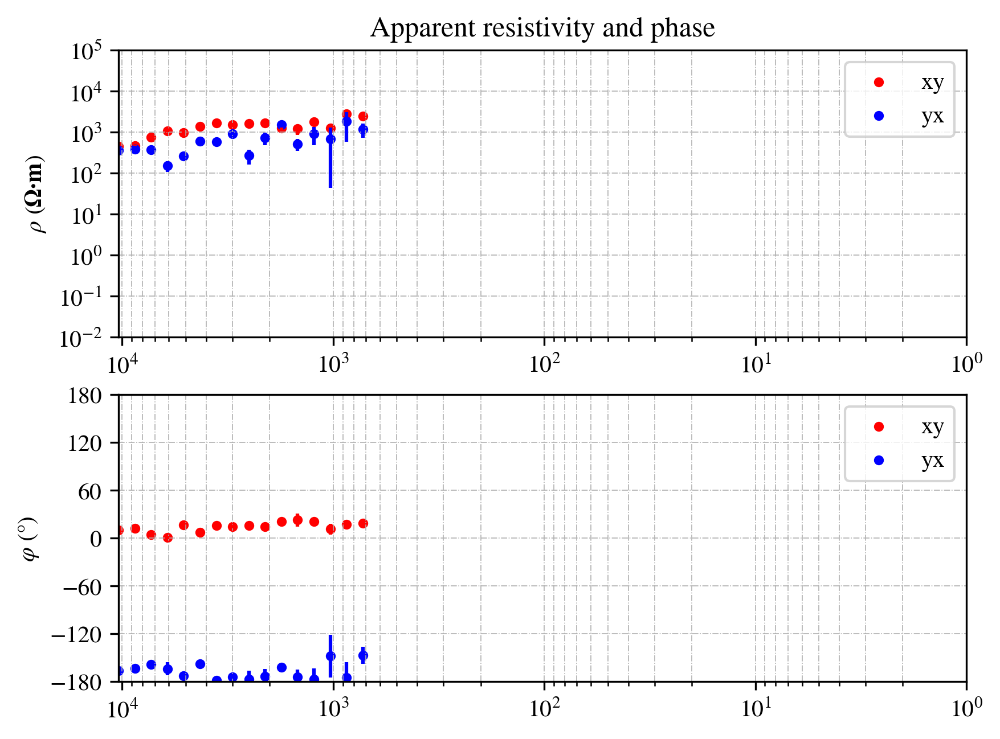

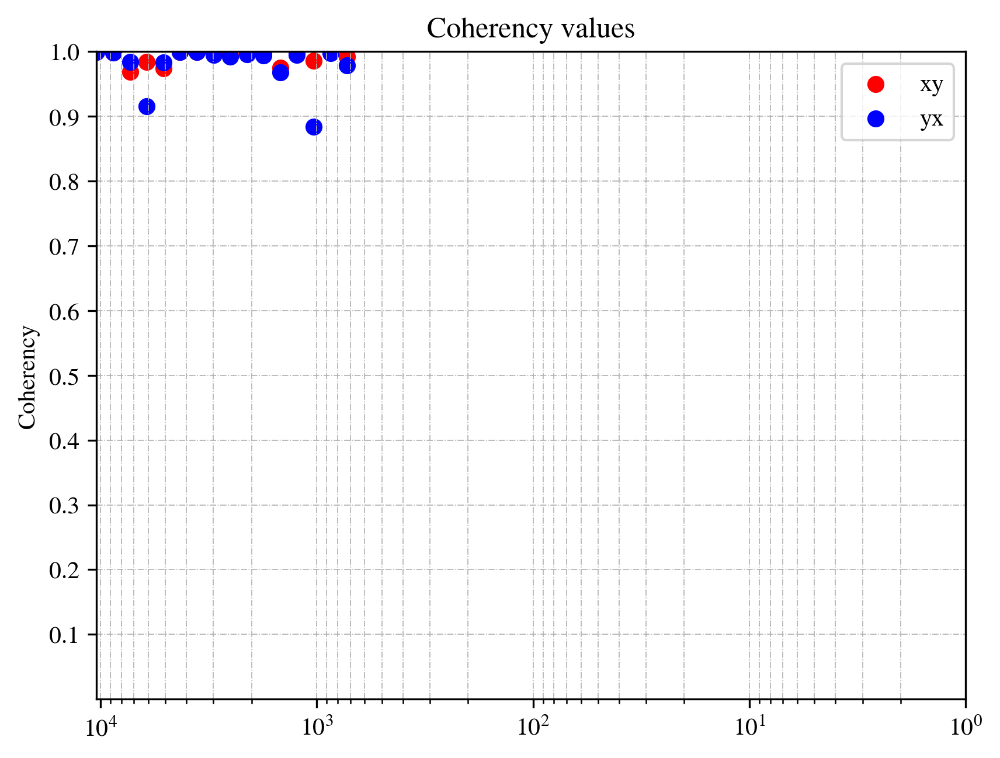

In [11]:
ts2,diff2 = {},[]
for i in [TS2_Ex,TS2_Ey,TS2_Hx,TS2_Hy]:
    diff2.append(i)

ts2['tsEx'] = diff2[0] 
ts2['tsEy'] = diff2[1] 
ts2['tsHx'] = diff2[2] 
ts2['tsHy'] = diff2[3] 

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = 24000 # 24000,2400,150
procinfo['level'] = 2 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts2['tsEx'])
procinfo['notch'] = 1 # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 50 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist2_d,bandavg2_d,Z_huber2_d,Zvar2_d,cohEx2_d,cohEy2_d = main_TS2(ts2,procinfo,config)

## 干净part

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  24000 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  79416
--------------------

Window Length selected:  1024
Time series overlap:  0%
No. of windows:  77
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 37.81it/s]



Computing Jackknife estimate....ft = 10400.0

Computing Jackknife estimate....ft = 8707.0

Computing Jackknife estimate....ft = 7289.0

Computing Jackknife estimate....ft = 6102.0

Computing Jackknife estimate....ft = 5108.0

Computing Jackknife estimate....ft = 4277.0

Computing Jackknife estimate....ft = 3580.0

Computing Jackknife estimate....ft = 2997.0

Computing Jackknife estimate....ft = 2509.0

Computing Jackknife estimate....ft = 2101.0

Computing Jackknife estimate....ft = 1759.0

Computing Jackknife estimate....ft = 1472.0

Computing Jackknife estimate....ft = 1233.0

Computing Jackknife estimate....ft = 1032.0

Computing Jackknife estimate....ft = 863.9

Computing Jackknife estimate....ft = 723.2
Finished.

Computing Huber estimate....ft = 10400.0

Computing Huber estimate....ft = 8707.0

Computing Huber estimate....ft = 7289.0

Computing Huber estimate....ft = 6102.0

Computing Huber estimate....ft = 5108.0

Computing Huber estimate....ft = 4277.0

Computing Huber estimat

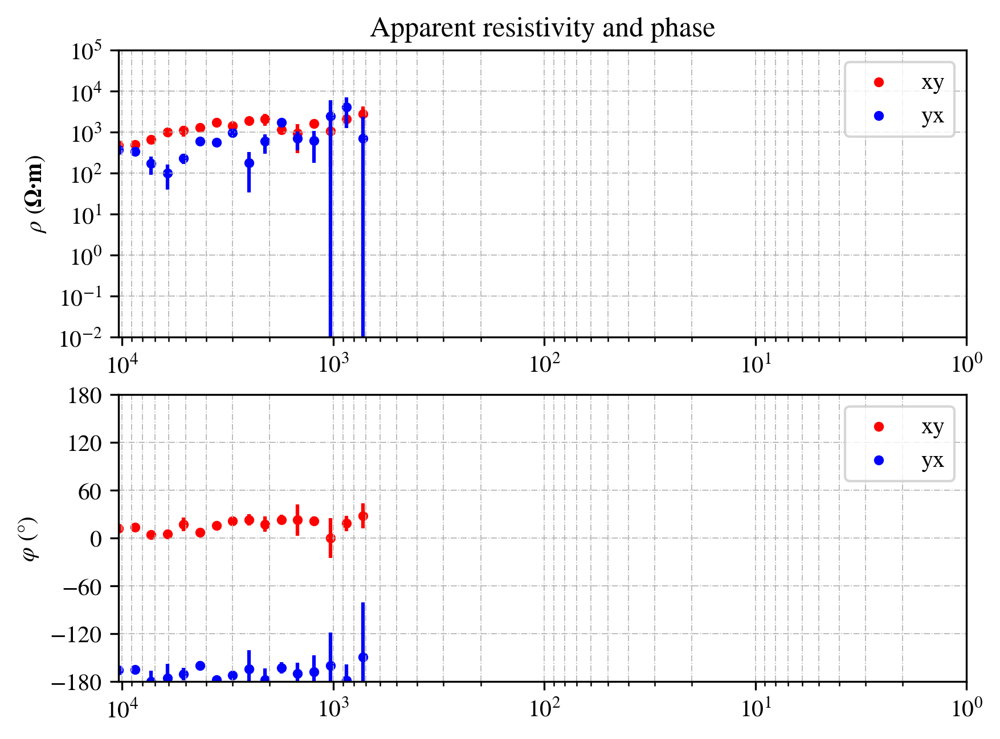

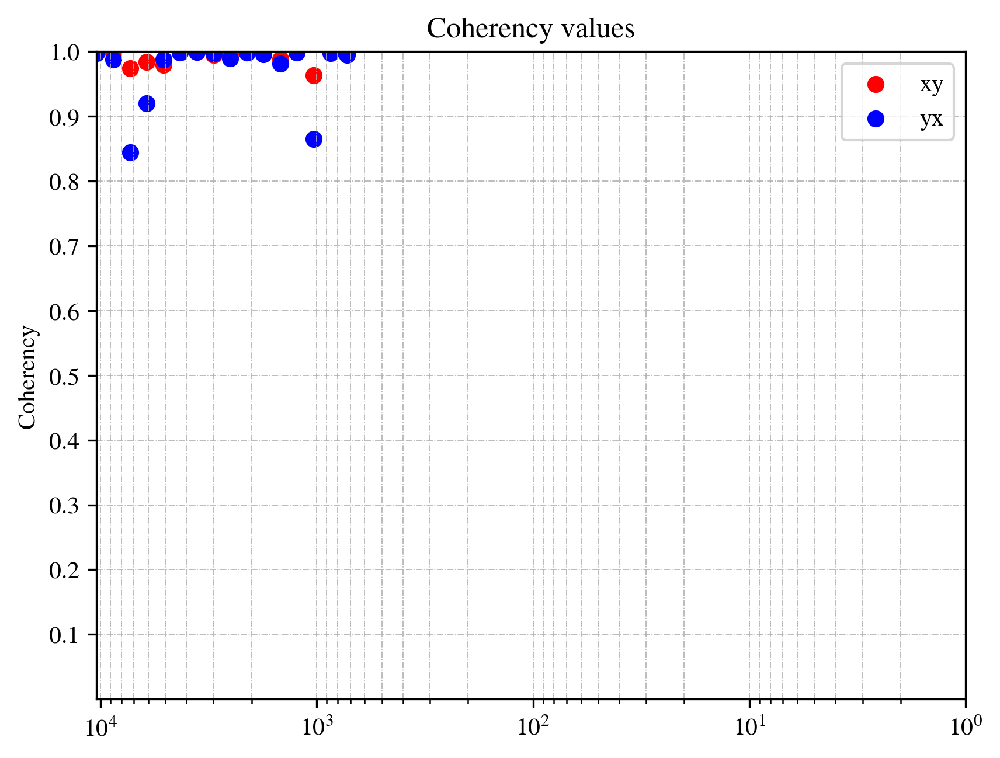

In [12]:
ts2 = {} 
ts2['tsEx'] = TS2_Ex_c
ts2['tsEy'] = TS2_Ey_c 
ts2['tsHx'] = TS2_Hx_c
ts2['tsHy'] = TS2_Hy_c

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = 24000 # 24000,2400,150
procinfo['level'] = 2 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts2['tsEx'])
procinfo['notch'] = 1 # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 0 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist2_c,bandavg2_c,Z_huber2_c,Zvar2_c,cohEx2_c,cohEy2_c = main_TS2(ts2,procinfo,config)

# TS3

In [13]:
def main_TS3(ts,procinfo,config,factor=1e4):
    
    global site,file

    print('--------------------')
    print('MT site: ',procinfo['selectedsite'])
    print('Measurement directory: ',procinfo['meas'])
    print('fs= ', str(procinfo.get('fs')) +' Hz')
    print('Sensor numbers:',procinfo.get('sensor_no'))# 这里的序列号是用来寻找标定文件.txt的
    print('Calib filles:',procinfo.get('cal_path'))
    print('Length of time series = ',str(procinfo.get('nofs')))
    print('--------------------')
    print('\nWindow Length selected: ', str(procinfo.get('WindowLength')))
    print('Time series overlap: ', str(procinfo.get('overlap'))+'%')
    print('No. of windows: ',str(procinfo.get('nstacks')))
    print('--------------------')
    #==================== Start band averaging ====================
    # No need to edit
    # Band average value after calibration and averaging using parzen window
    ftlist3,bandavg3 = mtproc.bandavg_Tsn(ts,procinfo,config,factor) # ftlist:(频率数) bandavg:dict，包含自/互功率谱数据
    #
    #==================== Band averaging finished =================
    cohMatrixEx = np.ones(np.shape(bandavg3.get('ExExc')),dtype=float) # (13, 1445)
    cohMatrixEy = np.ones(np.shape(bandavg3.get('ExExc')),dtype=float)
    pdmat = np.ones(np.shape(bandavg3.get('ExExc')),dtype=float)
    # Calculation of coherency values for all time windows
    AllcohEx = data_sel.cohEx(bandavg3) # (13, 1445)
    AllcohEy = data_sel.cohEy(bandavg3) # (13, 1445)
    # Calculation of polarization directions for all time windows
    alpha_degH,alpha_degE = data_sel.pdvalues(bandavg3) # (13, 1445)

    #====== Coherency threshold ======
    ctflag = 1 # Give '1' to perform coherency threshold based selection
    if ctflag == 1:
        CohThre = [0.9] * np.shape(AllcohEx)[0] # 相干性阈值范围 
        for i in range(np.shape(AllcohEx)[0]):
            for j in range(np.shape(AllcohEx)[1]):
                if AllcohEx[i,j] < CohThre[i]: # 同一频点，Ex第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEx[i,j] = 0
                else:
                    cohMatrixEx[i,j] = 1
                if AllcohEy[i,j] < CohThre[i]: # 同一频点，Ey第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEy[i,j] = 0
                else:
                    cohMatrixEy[i,j] = 1
    #
    #====== Polarization direction ======
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        pdlim = [-10,10] # 方法一：极化方向范围
        alpha = alpha_degE # Use either alpha_degE or alpha_degH 用其中一个极化方向进行阈值选择数据
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if alpha[i,j] > pdlim[0] and alpha[i,j] < pdlim[1]: # 同一频点，电场极化方向在拒绝极化方向范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1
    #            
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        timewindow_limits = [0,5] #方法二： 时间窗范围
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if j > timewindow_limits[0] and j < timewindow_limits[1]: # 同一频点，时间窗位置索引在拒绝时间窗索引范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1

                    # cohMatrix*起到利用相干性挑选质量好的数据的作用，mask1
    # pdmat起到利用极化方向挑选质量好的数据的作用（有两种方法：极化范围 and 时间窗，可以同时使用两种方法） mask2
    bandavg3['cohMatrixEx'] = cohMatrixEx 
    bandavg3['cohMatrixEy'] = cohMatrixEy
    bandavg3['pre_sel_matEx'] = cohMatrixEx * pdmat # 同时满足mask1 和 mask2来挑选质量好的数据
    bandavg3['pre_sel_matEy'] = cohMatrixEy * pdmat
    bandavg3['mdmatrixEx'],bandavg3['Zxx_mcd'],bandavg3['Zxy_mcd'],bandavg3['mahal_robustEx'] = mahaDist.mcd(bandavg3,'Ex',config) # 计算马氏距离
    bandavg3['mdmatrixEy'],bandavg3['Zyx_mcd'],bandavg3['Zyy_mcd'],bandavg3['mahal_robustEy'] = mahaDist.mcd(bandavg3,'Ey',config)
    bandavg3['selectedEx'] = bandavg3.get('mdmatrixEx')
    bandavg3['selectedEy'] = bandavg3.get('mdmatrixEy')
    bandavg3['avgt'] = np.sum((bandavg3.get('selectedEx'))!=0,axis=1)
    Z_huber3 = mtproc.perform_robust(ftlist3,bandavg3)

    #==================== Calculation of variance ===================
    Zvar3 = {}
    Zvar3['xx'],Zvar3['xy'],cohEx3 = var.ZExvar(Z_huber3,bandavg3)
    Zvar3['yx'],Zvar3['yy'],cohEy3 = var.ZEyvar(Z_huber3,bandavg3)

    plotting.plotfigs(ftlist3, Z_huber3, Zvar3, cohEx3, cohEy3)
    return ftlist3, bandavg3, Z_huber3, Zvar3, cohEx3, cohEy3

## 原始时序

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  2400 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  840000
--------------------

Window Length selected:  8192
Time series overlap:  50%
No. of windows:  102
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]



Computing Jackknife estimate....ft = 605.4

Computing Jackknife estimate....ft = 506.9

Computing Jackknife estimate....ft = 424.3

Computing Jackknife estimate....ft = 355.2

Computing Jackknife estimate....ft = 297.4

Computing Jackknife estimate....ft = 249.0

Computing Jackknife estimate....ft = 208.4

Computing Jackknife estimate....ft = 174.5

Computing Jackknife estimate....ft = 146.1

Computing Jackknife estimate....ft = 122.3

Computing Jackknife estimate....ft = 102.4

Computing Jackknife estimate....ft = 85.71

Computing Jackknife estimate....ft = 71.15

Computing Jackknife estimate....ft = 60.07

Computing Jackknife estimate....ft = 50.29
Finished.

Computing Huber estimate....ft = 605.4

Computing Huber estimate....ft = 506.9

Computing Huber estimate....ft = 424.3

Computing Huber estimate....ft = 355.2

Computing Huber estimate....ft = 297.4

Computing Huber estimate....ft = 249.0

Computing Huber estimate....ft = 208.4

Computing Huber estimate....ft = 174.5

Computing

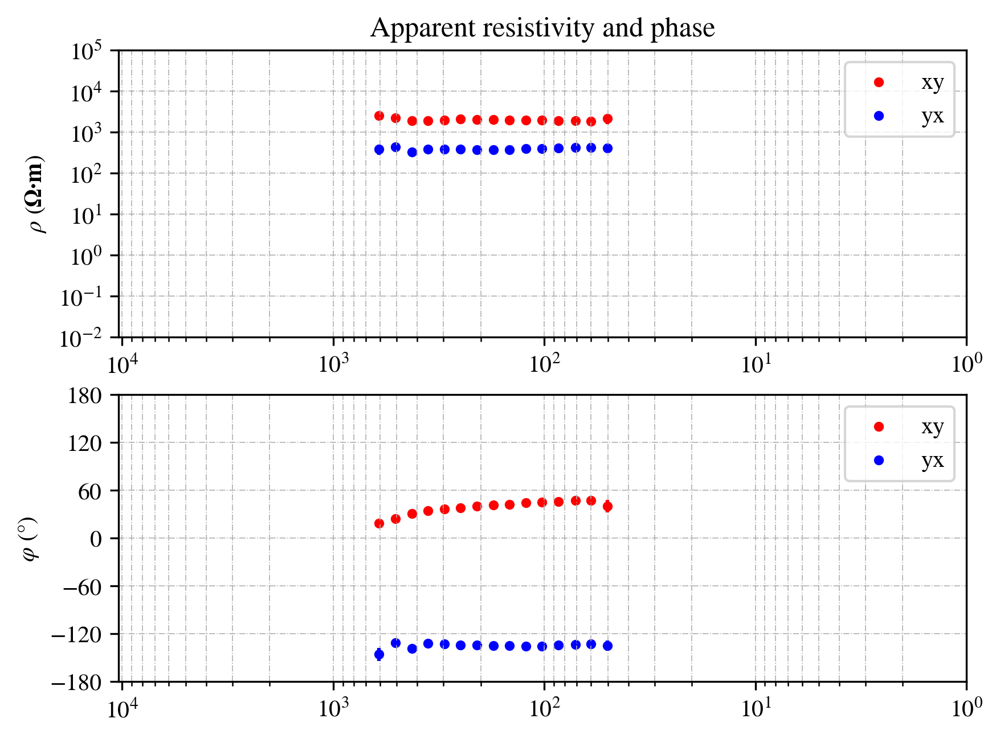

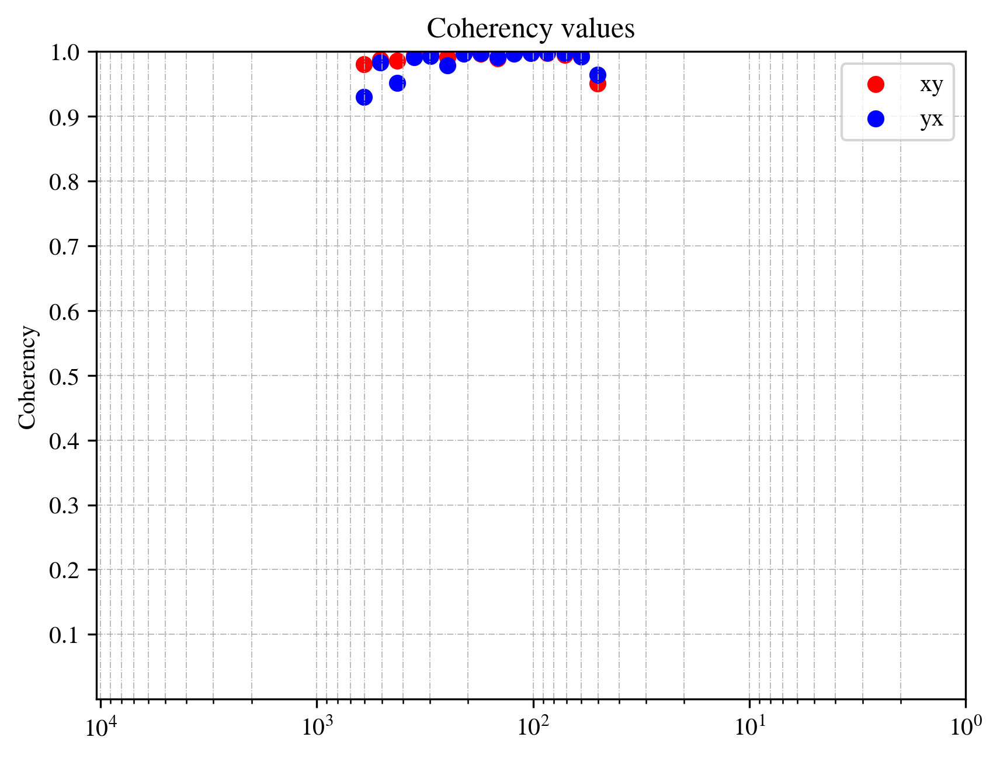

In [14]:
ts3 = {}
ts3['tsEx'] = TS3_Ex
ts3['tsEy'] = TS3_Ey 
ts3['tsHx'] = TS3_Hx
ts3['tsHy'] = TS3_Hy
fs = 2400
notch = 1 # Notch flag 1 - On, 0 - Off

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = fs # 24000,2400,150
procinfo['level'] = 3 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts3['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 50 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist3_o,bandavg3_o,Z_huber3_o,Zvar3_o,cohEx3_o,cohEy3_o = main_TS3(ts3,procinfo,config)

## 去噪后

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  2400 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  840000
--------------------

Window Length selected:  8192
Time series overlap:  50%
No. of windows:  102
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]



Computing Jackknife estimate....ft = 605.4

Computing Jackknife estimate....ft = 506.9

Computing Jackknife estimate....ft = 424.3

Computing Jackknife estimate....ft = 355.2

Computing Jackknife estimate....ft = 297.4

Computing Jackknife estimate....ft = 249.0

Computing Jackknife estimate....ft = 208.4

Computing Jackknife estimate....ft = 174.5

Computing Jackknife estimate....ft = 146.1

Computing Jackknife estimate....ft = 122.3

Computing Jackknife estimate....ft = 102.4

Computing Jackknife estimate....ft = 85.71

Computing Jackknife estimate....ft = 71.15

Computing Jackknife estimate....ft = 60.07

Computing Jackknife estimate....ft = 50.29
Finished.

Computing Huber estimate....ft = 605.4

Computing Huber estimate....ft = 506.9

Computing Huber estimate....ft = 424.3

Computing Huber estimate....ft = 355.2

Computing Huber estimate....ft = 297.4

Computing Huber estimate....ft = 249.0

Computing Huber estimate....ft = 208.4

Computing Huber estimate....ft = 174.5

Computing

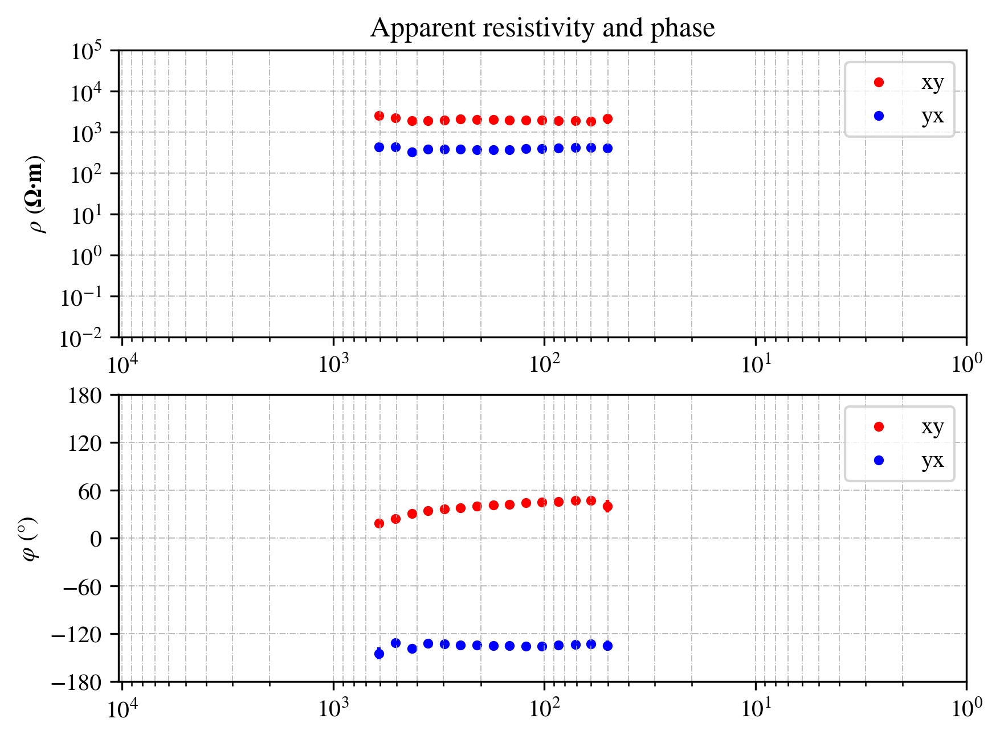

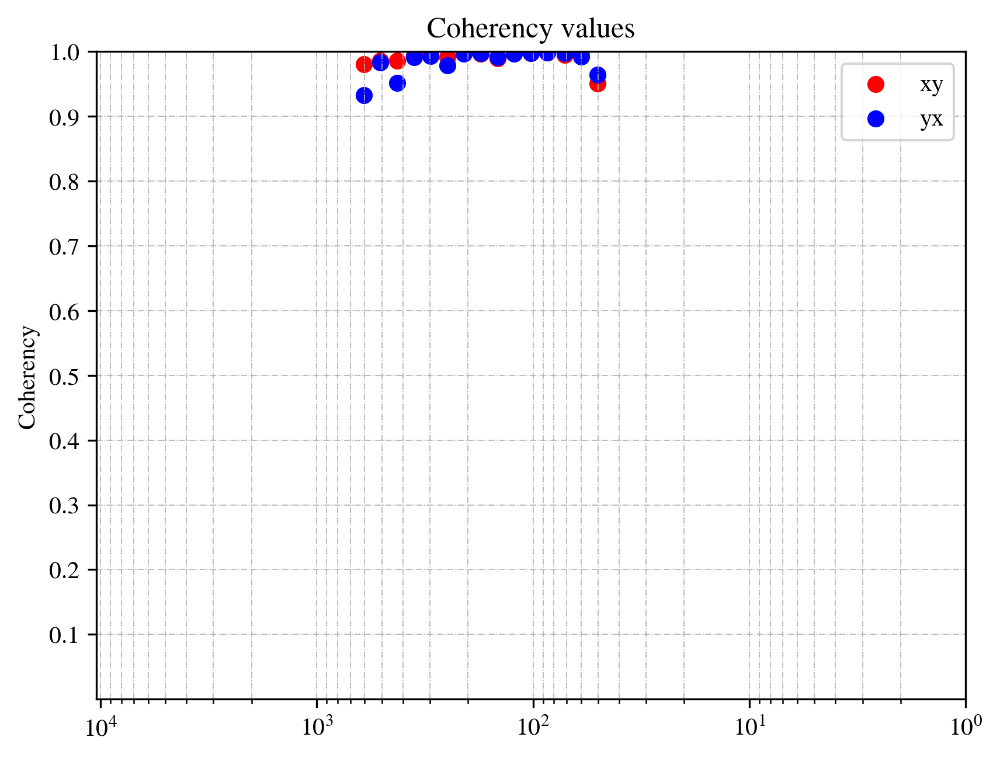

In [15]:
ts3,diff3 = {},[]
for i in [TS3_Ex,TS3_Ey,TS3_Hx,TS3_Hy]:
    diff3.append(i)

ts3['tsEx'] = diff3[0] 
ts3['tsEy'] = diff3[1] 
ts3['tsHx'] = diff3[2] 
ts3['tsHy'] = diff3[3] 

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = 2400# 24000,2400,150
procinfo['level'] = 3 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts3['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 50 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist3_d,bandavg3_d,Z_huber3_d,Zvar3_d,cohEx3_d,cohEy3_d = main_TS3(ts3,procinfo,config)

## 干净part

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  2400 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  81920
--------------------

Window Length selected:  1024
Time series overlap:  50%
No. of windows:  80
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 17.97it/s]



Computing Jackknife estimate....ft = 605.4

Computing Jackknife estimate....ft = 506.9

Computing Jackknife estimate....ft = 424.3

Computing Jackknife estimate....ft = 355.2

Computing Jackknife estimate....ft = 297.4

Computing Jackknife estimate....ft = 249.0

Computing Jackknife estimate....ft = 208.4

Computing Jackknife estimate....ft = 174.5

Computing Jackknife estimate....ft = 146.1

Computing Jackknife estimate....ft = 122.3

Computing Jackknife estimate....ft = 102.4

Computing Jackknife estimate....ft = 85.71

Computing Jackknife estimate....ft = 71.15

Computing Jackknife estimate....ft = 60.07

Computing Jackknife estimate....ft = 50.29
Finished.

Computing Huber estimate....ft = 605.4

Computing Huber estimate....ft = 506.9

Computing Huber estimate....ft = 424.3

Computing Huber estimate....ft = 355.2

Computing Huber estimate....ft = 297.4

Computing Huber estimate....ft = 249.0

Computing Huber estimate....ft = 208.4

Computing Huber estimate....ft = 174.5

Computing

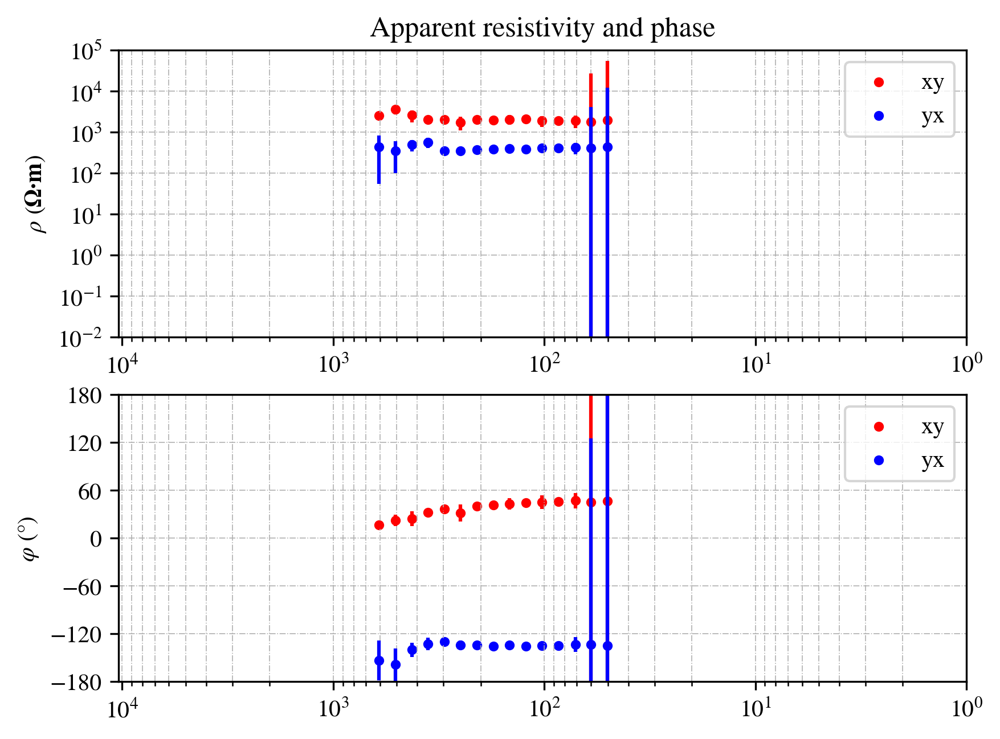

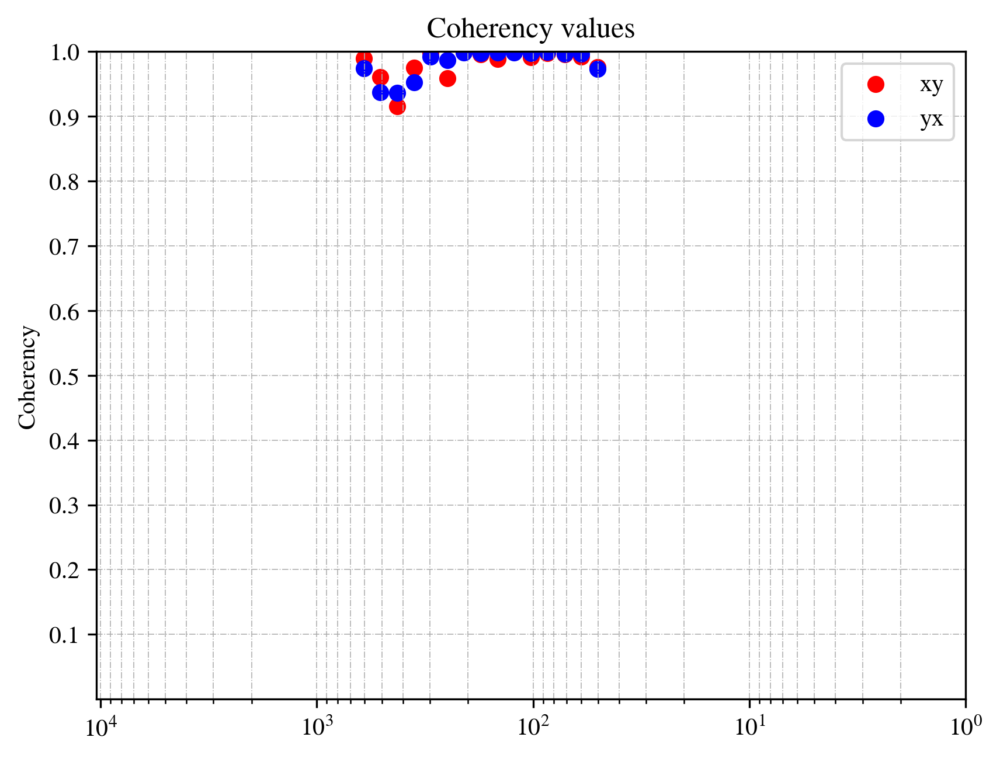

In [17]:
ts3 = {} 
ts3['tsEx'] = TS3_Ex_c
ts3['tsEy'] = TS3_Ey_c 
ts3['tsHx'] = TS3_Hx_c
ts3['tsHy'] = TS3_Hy_c

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = 2400 # 24000,2400,150
procinfo['level'] = 3 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts3['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 50 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist3_c,bandavg3_c,Z_huber3_c,Zvar3_c,cohEx3_c,cohEy3_c = main_TS3(ts3,procinfo,config)

# TS4

In [18]:
def main_TS4(ts,procinfo,config,factor=1e4):
    
    global site,file

    print('--------------------')
    print('MT site: ',procinfo['selectedsite'])
    print('Measurement directory: ',procinfo['meas'])
    print('fs= ', str(procinfo.get('fs')) +' Hz')
    print('Sensor numbers:',procinfo.get('sensor_no'))# 这里的序列号是用来寻找标定文件.txt的
    print('Calib filles:',procinfo.get('cal_path'))
    print('Length of time series = ',str(procinfo.get('nofs')))
    print('--------------------')
    print('\nWindow Length selected: ', str(procinfo.get('WindowLength')))
    print('Time series overlap: ', str(procinfo.get('overlap'))+'%')
    print('No. of windows: ',str(procinfo.get('nstacks')))
    print('--------------------')
    #==================== Start band averaging ====================
    # No need to edit
    # Band average value after calibration and averaging using parzen window
    ftlist4,bandavg4 = mtproc.bandavg_Tsn(ts,procinfo,config,factor) # ftlist:(频率数) bandavg:dict，包含自/互功率谱数据
    #
    #==================== Band averaging finished =================
    cohMatrixEx = np.ones(np.shape(bandavg4.get('ExExc')),dtype=float) # (13, 1445)
    cohMatrixEy = np.ones(np.shape(bandavg4.get('ExExc')),dtype=float)
    pdmat = np.ones(np.shape(bandavg4.get('ExExc')),dtype=float)
    # Calculation of coherency values for all time windows
    AllcohEx = data_sel.cohEx(bandavg4) # (13, 1445)
    AllcohEy = data_sel.cohEy(bandavg4) # (13, 1445)
    # Calculation of polarization directions for all time windows
    alpha_degH,alpha_degE = data_sel.pdvalues(bandavg4) # (13, 1445)

    #====== Coherency threshold ======
    ctflag = 0 # Give '1' to perform coherency threshold based selection
    if ctflag == 1:
        CohThre = [0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.88,0.8,0.8,0.8,0.8,0.7,0.7,0.7,0.7,0.7,0.7,0.7,0.7,0.7,0.7] # 相干性阈值范围 
        for i in range(np.shape(AllcohEx)[0]):
            for j in range(np.shape(AllcohEx)[1]):
                if AllcohEx[i,j] < CohThre[i]: # 同一频点，Ex第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEx[i,j] = 0
                else:
                    cohMatrixEx[i,j] = 1
                if AllcohEy[i,j] < CohThre[i]: # 同一频点，Ey第j个stack窗口数相干性计算结果 < 设置的相干性阈值，设置为0
                    cohMatrixEy[i,j] = 0
                else:
                    cohMatrixEy[i,j] = 1
    #
    #====== Polarization direction ======
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        pdlim = [-10,10] # 方法一：极化方向范围
        alpha = alpha_degE # Use either alpha_degE or alpha_degH 用其中一个极化方向进行阈值选择数据
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if alpha[i,j] > pdlim[0] and alpha[i,j] < pdlim[1]: # 同一频点，电场极化方向在拒绝极化方向范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1
    #            
    pdflag = 0 # Give '1' to perform polarization direction based selection
    if pdflag == 1:
        timewindow_limits = [0,5] #方法二： 时间窗范围
        for i in range(np.shape(pdmat)[0]):
            for j in range(np.shape(pdmat)[1]):
                if j > timewindow_limits[0] and j < timewindow_limits[1]: # 同一频点，时间窗位置索引在拒绝时间窗索引范围内，设置为0，拒绝该数据
                    pdmat[i,j] = 0
                else:
                    pdmat[i,j] = 1

                    # cohMatrix*起到利用相干性挑选质量好的数据的作用，mask1
    # pdmat起到利用极化方向挑选质量好的数据的作用（有两种方法：极化范围 and 时间窗，可以同时使用两种方法） mask2
    bandavg4['cohMatrixEx'] = cohMatrixEx 
    bandavg4['cohMatrixEy'] = cohMatrixEy
    bandavg4['pre_sel_matEx'] = cohMatrixEx * pdmat # 同时满足mask1 和 mask2来挑选质量好的数据
    bandavg4['pre_sel_matEy'] = cohMatrixEy * pdmat
    bandavg4['mdmatrixEx'],bandavg4['Zxx_mcd'],bandavg4['Zxy_mcd'],bandavg4['mahal_robustEx'] = mahaDist.mcd(bandavg4,'Ex',config) # 计算马氏距离
    bandavg4['mdmatrixEy'],bandavg4['Zyx_mcd'],bandavg4['Zyy_mcd'],bandavg4['mahal_robustEy'] = mahaDist.mcd(bandavg4,'Ey',config)
    bandavg4['selectedEx'] = bandavg4.get('mdmatrixEx')
    bandavg4['selectedEy'] = bandavg4.get('mdmatrixEy')
    bandavg4['avgt'] = np.sum((bandavg4.get('selectedEx'))!=0,axis=1)
    Z_huber4 = mtproc.perform_robust(ftlist4,bandavg4)

    #==================== Calculation of variance ===================
    Zvar4 = {}
    Zvar4['xx'],Zvar4['xy'],cohEx4 = var.ZExvar(Z_huber4,bandavg4)
    Zvar4['yx'],Zvar4['yy'],cohEy4 = var.ZEyvar(Z_huber4,bandavg4)
    
    plotting.plotfigs(ftlist4, Z_huber4, Zvar4, cohEx4, cohEy4)
    return ftlist4, bandavg4,Z_huber4, Zvar4, cohEx4, cohEy4

## 原始时序

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  150 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  308250
--------------------

Window Length selected:  2048
Time series overlap:  100%
No. of windows:  150
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 22/22 [00:01<00:00, 14.39it/s]



Computing Jackknife estimate....ft = 42.1

Computing Jackknife estimate....ft = 35.25

Computing Jackknife estimate....ft = 29.51

Computing Jackknife estimate....ft = 24.7

Computing Jackknife estimate....ft = 20.68

Computing Jackknife estimate....ft = 17.31

Computing Jackknife estimate....ft = 14.49

Computing Jackknife estimate....ft = 12.13

Computing Jackknife estimate....ft = 10.16

Computing Jackknife estimate....ft = 8.504

Computing Jackknife estimate....ft = 7.119

Computing Jackknife estimate....ft = 5.96

Computing Jackknife estimate....ft = 4.99

Computing Jackknife estimate....ft = 4.177

Computing Jackknife estimate....ft = 3.497

Computing Jackknife estimate....ft = 2.928

Computing Jackknife estimate....ft = 2.451

Computing Jackknife estimate....ft = 2.052

Computing Jackknife estimate....ft = 1.718

Computing Jackknife estimate....ft = 1.438

Computing Jackknife estimate....ft = 1.204

Computing Jackknife estimate....ft = 1.008
Finished.

Computing Huber estimate.

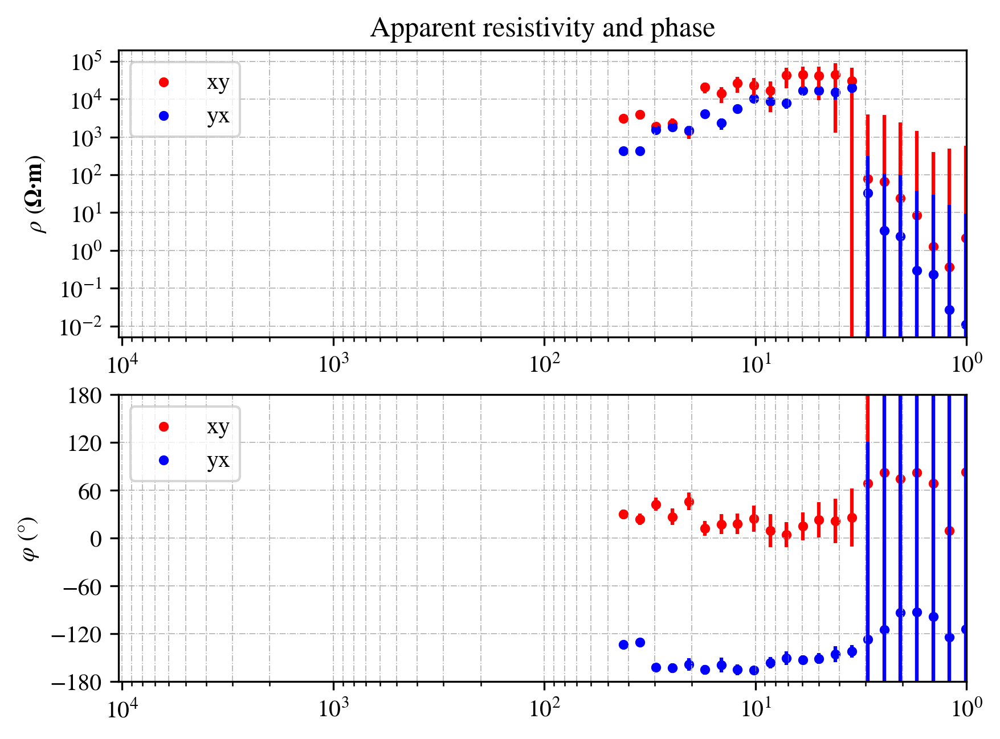

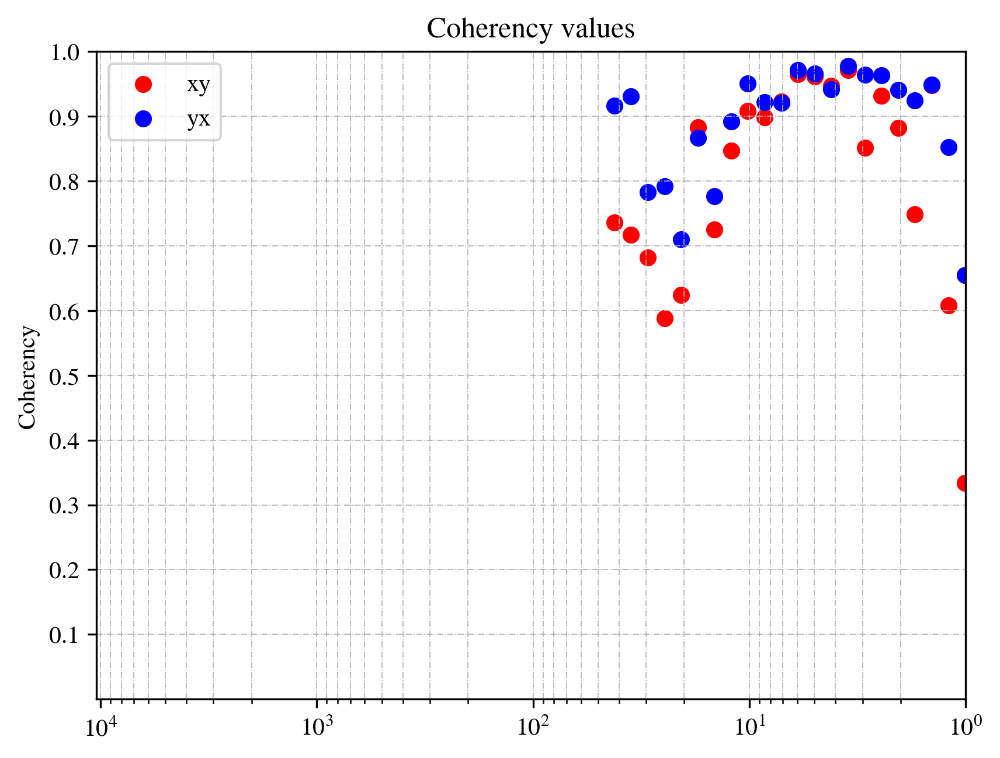

In [19]:
ts4 = {}
ts4['tsEx'] = TS4_Ex
ts4['tsEy'] = TS4_Ey 
ts4['tsHx'] = TS4_Hx
ts4['tsHy'] = TS4_Hy
fs = 150
notch = 1 # Notch flag 1 - On, 0 - Off

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = fs # 24000,2400,150
procinfo['level'] = 4 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts4['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 100 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist4_o,bandavg4_o,Z_huber4_o,Zvar4_o,cohEx4_o,cohEy4_o = main_TS4(ts4,procinfo,config)

## 去噪后

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  150 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  307200
--------------------

Window Length selected:  2048
Time series overlap:  100%
No. of windows:  150
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 22/22 [00:01<00:00, 14.82it/s]



Computing Jackknife estimate....ft = 42.1

Computing Jackknife estimate....ft = 35.25

Computing Jackknife estimate....ft = 29.51

Computing Jackknife estimate....ft = 24.7

Computing Jackknife estimate....ft = 20.68

Computing Jackknife estimate....ft = 17.31

Computing Jackknife estimate....ft = 14.49

Computing Jackknife estimate....ft = 12.13

Computing Jackknife estimate....ft = 10.16

Computing Jackknife estimate....ft = 8.504

Computing Jackknife estimate....ft = 7.119

Computing Jackknife estimate....ft = 5.96

Computing Jackknife estimate....ft = 4.99

Computing Jackknife estimate....ft = 4.177

Computing Jackknife estimate....ft = 3.497

Computing Jackknife estimate....ft = 2.928

Computing Jackknife estimate....ft = 2.451

Computing Jackknife estimate....ft = 2.052

Computing Jackknife estimate....ft = 1.718

Computing Jackknife estimate....ft = 1.438

Computing Jackknife estimate....ft = 1.204

Computing Jackknife estimate....ft = 1.008
Finished.

Computing Huber estimate.

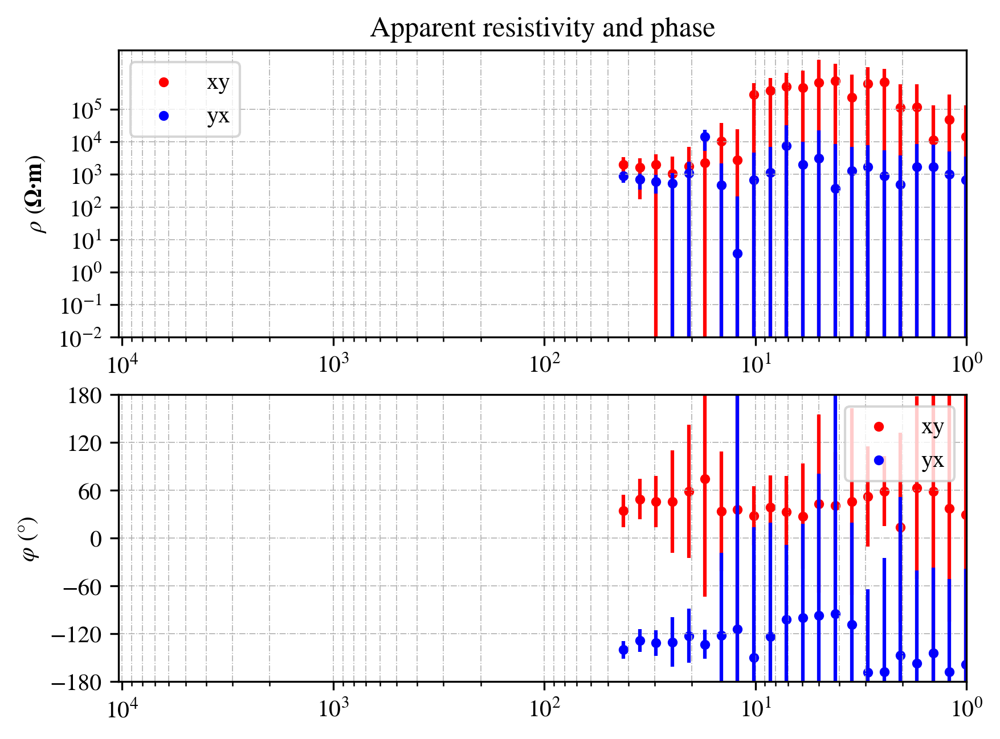

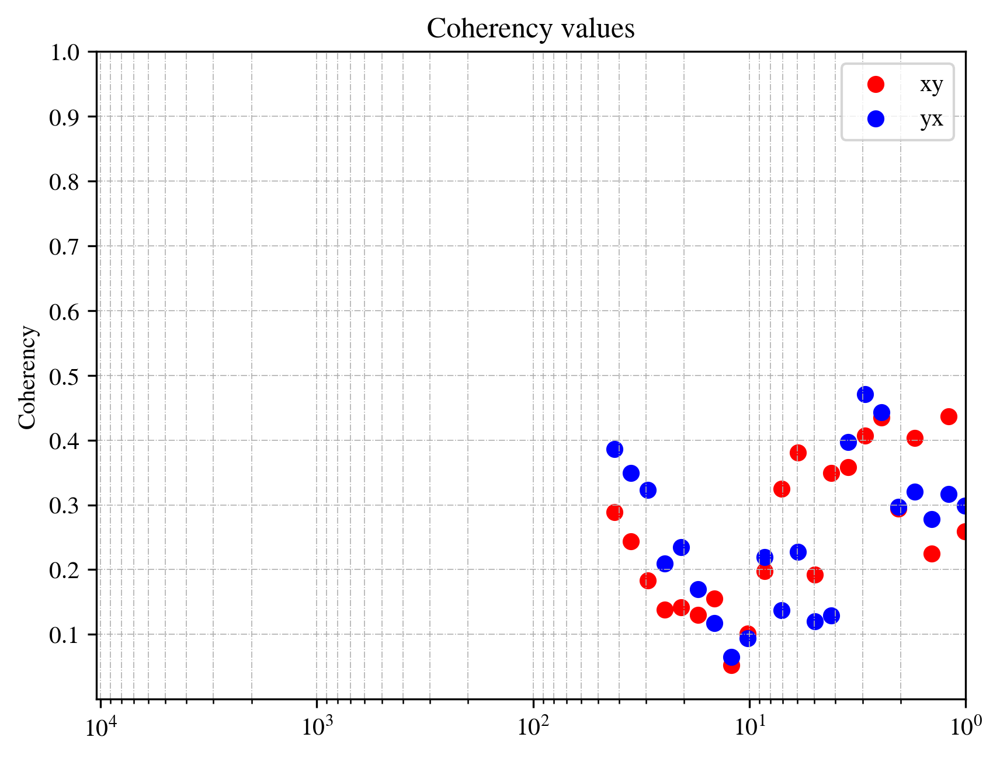

In [20]:
ts4,diff4 = {},[]

ts4['tsEx'] = TS4_Ex_denoise
ts4['tsEy'] = TS4_Ey_denoise
ts4['tsHx'] = TS4_Hx_denoise
ts4['tsHy'] = TS4_Hy_denoise

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = fs # 24000,2400,150
procinfo['level'] = 4 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts4['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 100 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist4_d,bandavg4_d,Z_huber4_d,Zvar4_d,cohEx4_d,cohEy4_d = main_TS4(ts4,procinfo,config)# factor=1e4/np.sqrt(10)

## 干净part

--------------------
MT site:  site101
Measurement directory:  102040U1
fs=  150 Hz
Sensor numbers: {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
Calib filles: SigMT/calib/
Length of time series =  30000
--------------------

Window Length selected:  512
Time series overlap:  100%
No. of windows:  58
--------------------
Applying notch filter...
Done!

Applying detrend...
Done!

Computing FFT...
Done!

Calibrating...
Done!

Band averaging over target frequencies:


100%|███████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 55.79it/s]



Computing Jackknife estimate....ft = 42.1

Computing Jackknife estimate....ft = 35.25

Computing Jackknife estimate....ft = 29.51

Computing Jackknife estimate....ft = 24.7

Computing Jackknife estimate....ft = 20.68

Computing Jackknife estimate....ft = 17.31

Computing Jackknife estimate....ft = 14.49

Computing Jackknife estimate....ft = 12.13

Computing Jackknife estimate....ft = 10.16

Computing Jackknife estimate....ft = 8.504

Computing Jackknife estimate....ft = 7.119

Computing Jackknife estimate....ft = 5.96

Computing Jackknife estimate....ft = 4.99

Computing Jackknife estimate....ft = 4.177

Computing Jackknife estimate....ft = 3.497

Computing Jackknife estimate....ft = 2.928

Computing Jackknife estimate....ft = 2.451

Computing Jackknife estimate....ft = 2.052

Computing Jackknife estimate....ft = 1.718

Computing Jackknife estimate....ft = 1.438

Computing Jackknife estimate....ft = 1.204

Computing Jackknife estimate....ft = 1.008
Finished.

Computing Huber estimate.

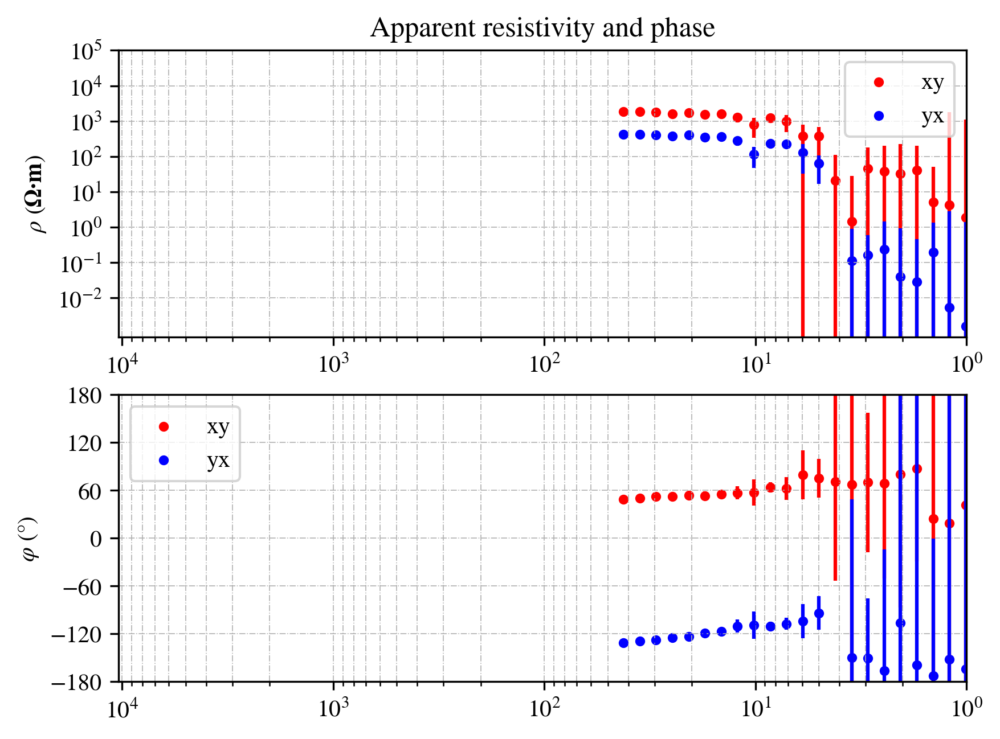

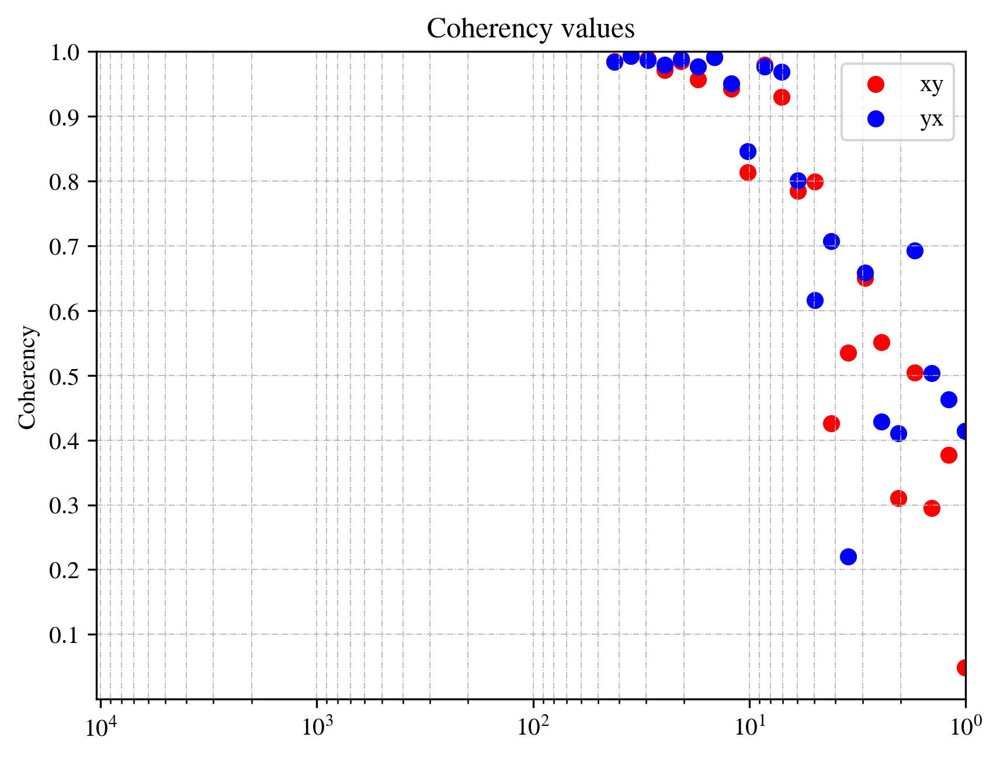

In [21]:
ts4 = {} 
ts4['tsEx'] = TS4_Ex_c
ts4['tsEy'] = TS4_Ey_c 
ts4['tsHx'] = TS4_Hx_c
ts4['tsHy'] = TS4_Hy_c

procinfo,config = {},{}
config['FFT_Length'] = 0 # Otherwise try 256, 512, 1024, 2048, 4096, 8192, 16384
config['parzen_radius'] = 0 # Give '0' to select default parzen radius
config['MD_threshold_impedance'] = 1.5 # Mahalanobis distance threshold value for impedance calculations
config['MD_threshold_tipper'] = 1.0 # Mahalanobis distance threshold value for tipper calculations

procinfo['cal_path'] = 'SigMT/calib/'
procinfo['sensor_no'] = {'Hx': ['300'], 'Hy': ['301'], 'Hz': ['302']}
procinfo['fs'] = fs # 24000,2400,150
procinfo['level'] = 4 # .Ts4 用于标定选择频段
procinfo['ChoppStat'] = 0#1#
procinfo['nofs'] = len(ts4['tsEx'])
procinfo['notch'] = notch # Notch flag 1 - On, 0 - Off
procinfo['meas'] = file
# procinfo['proc_path'] = proc_path
procinfo['selectedsite'] = site
if config.get('FFT_Length') == 0: # 默认为0
    procinfo['WindowLength'] = mtproc.FFTLength(procinfo.get('nofs'))
else:
    procinfo['WindowLength'] = config.get('FFT_Length')
procinfo['overlap'] = 100 #Input in percentage %
procinfo['nstacks'] = math.floor(procinfo.get('nofs')/procinfo.get('WindowLength'))

ftlist4_c,bandavg4_c,Z_huber4_c,Zvar4_c,cohEx4_c,cohEy4_c = main_TS4(ts4,procinfo,config)

# stack plot

## 原始时序

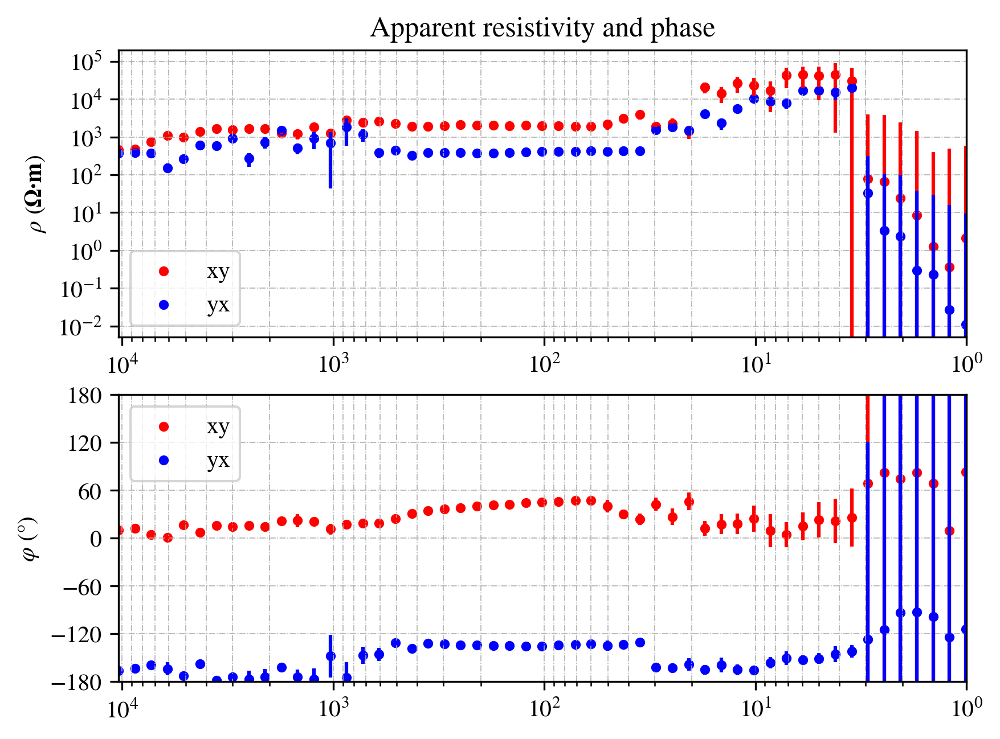

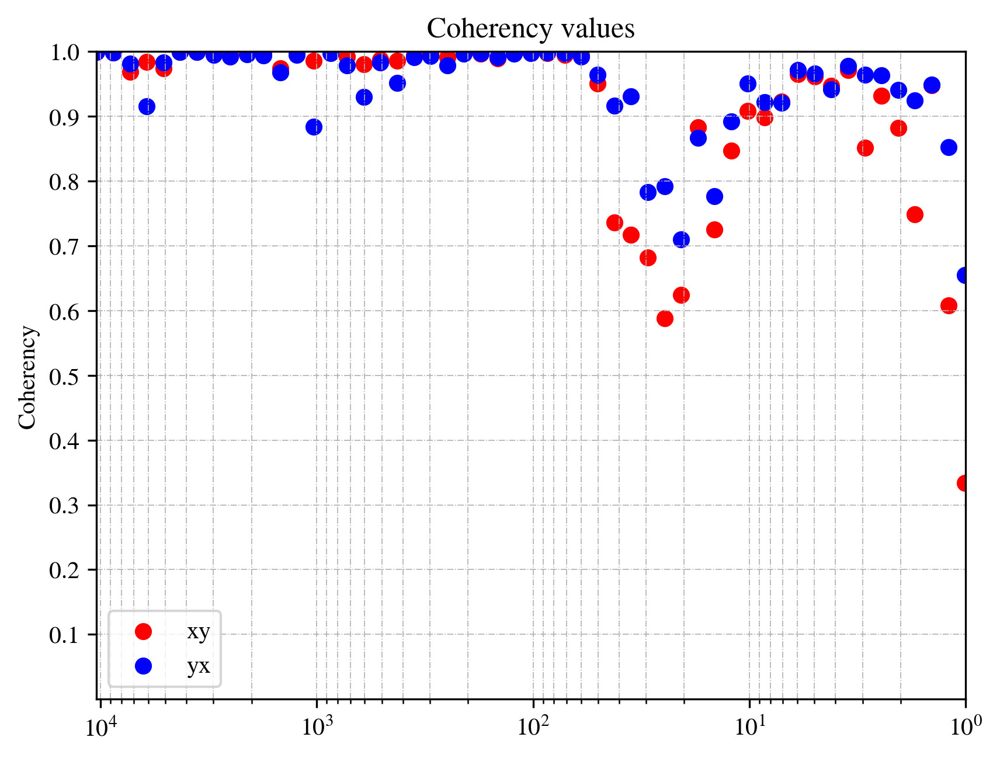

In [22]:
ftlist_o = np.vstack((ftlist2_o,ftlist3_o,ftlist4_o))
cohEx_o = np.vstack((cohEx2_o,cohEx3_o,cohEx4_o))
cohEy_o = np.vstack((cohEy2_o,cohEy3_o,cohEy4_o))
Z_huber_o,Zvar_o = {},{}
for i in Z_huber2_o.keys(): # ['Zxx','Zxy','Zyx','Zyy']
    Z_huber_o[i] = np.vstack((Z_huber2_o[i],Z_huber3_o[i],Z_huber4_o[i]))
for i in Zvar2_o.keys(): # ['xx','xy','yx','yy']
    Zvar_o[i] = np.vstack((Zvar2_o[i],Zvar3_o[i],Zvar4_o[i]))    

plotting.plotfigs(ftlist_o, Z_huber_o, Zvar_o, cohEx_o, cohEy_o)

## 去噪后

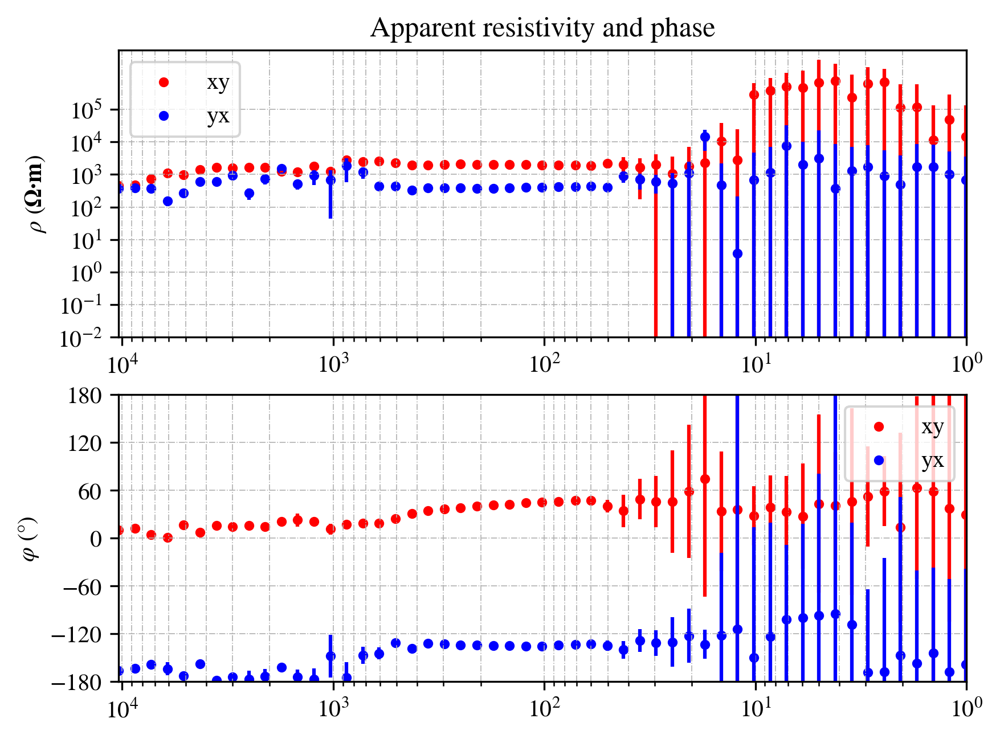

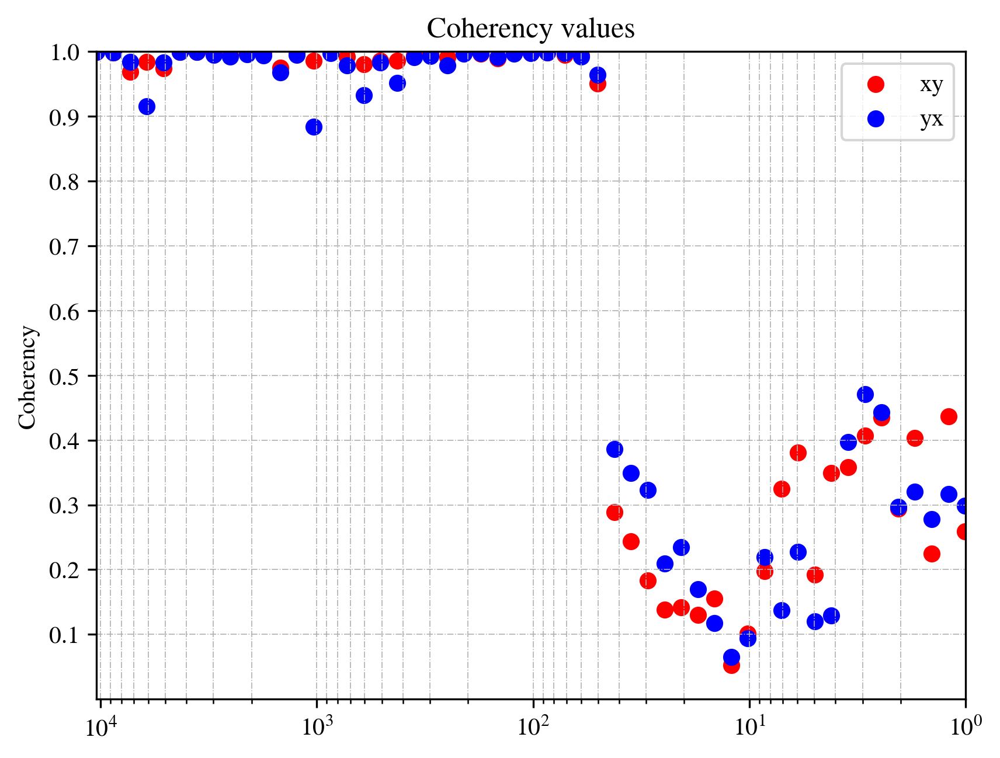

In [23]:
ftlist_d = np.vstack((ftlist2_d,ftlist3_d,ftlist4_d))
cohEx_d = np.vstack((cohEx2_d,cohEx3_d,cohEx4_d))
cohEy_d = np.vstack((cohEy2_d,cohEy3_d,cohEy4_d))
Z_huber_d,Zvar_d = {},{}
for i in Z_huber2_d.keys(): # ['Zxx','Zxy','Zyx','Zyy']
    Z_huber_d[i] = np.vstack((Z_huber2_d[i],Z_huber3_d[i],Z_huber4_d[i]))
for i in Zvar2_d.keys(): # ['xx','xy','yx','yy']
    Zvar_d[i] = np.vstack((Zvar2_d[i],Zvar3_d[i],Zvar4_d[i]))    

plotting.plotfigs(ftlist_d, Z_huber_d, Zvar_d, cohEx_d, cohEy_d)

## 干净part

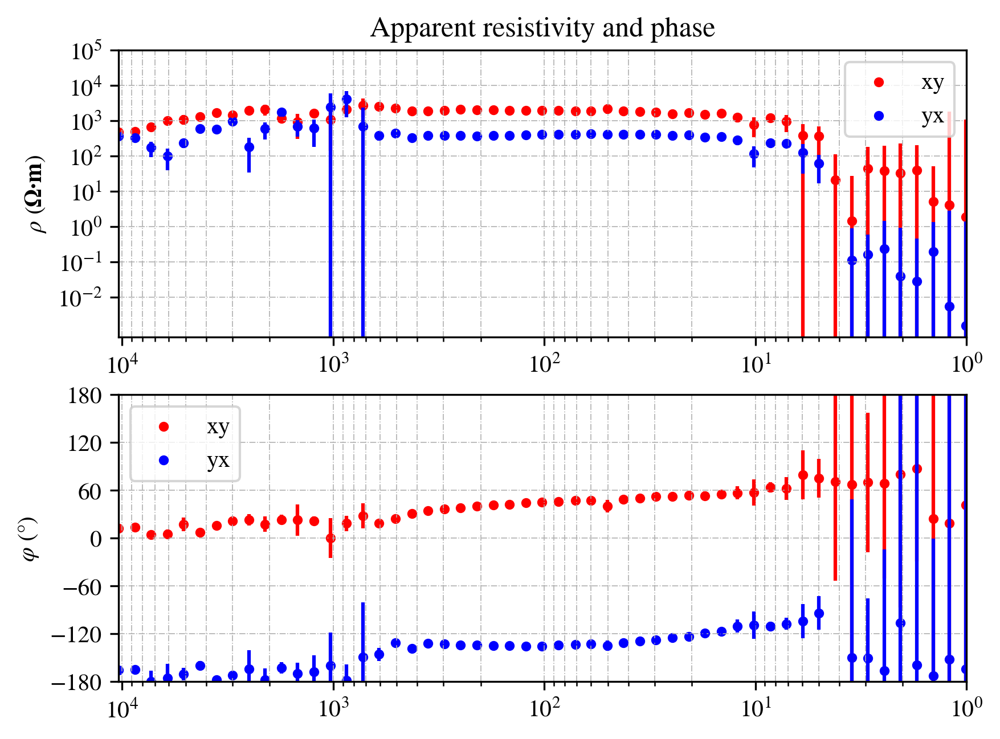

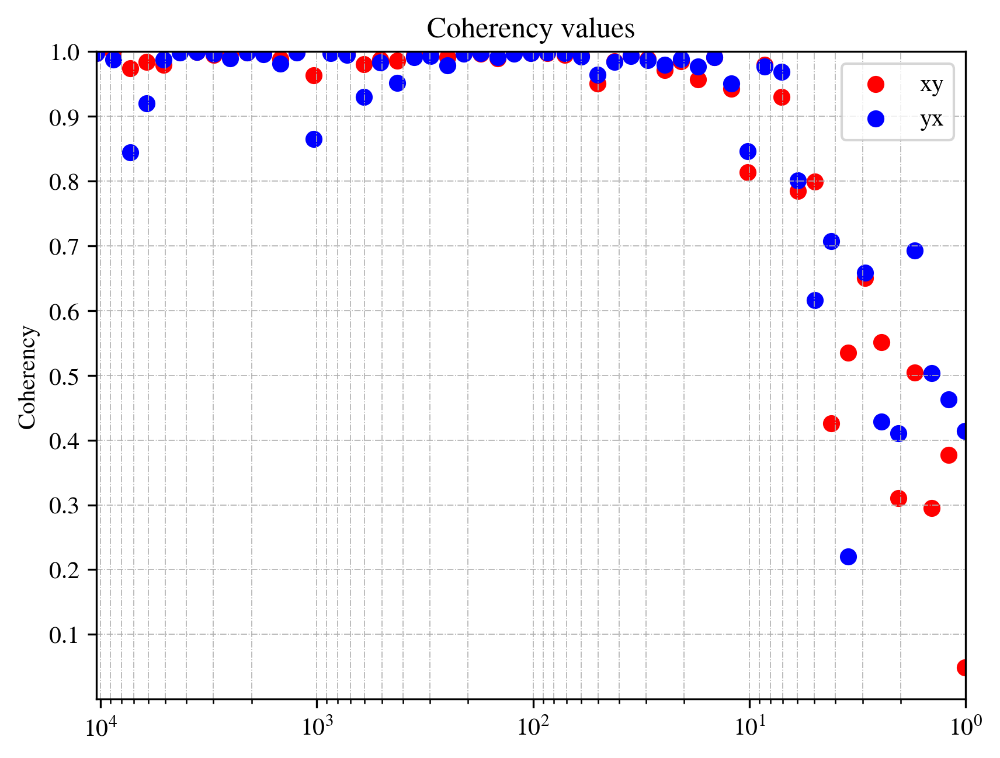

In [24]:
ftlist_c = np.vstack((ftlist2_c,ftlist3_o,ftlist4_c)) # 用低频fs计算中频数据，曲线平滑
cohEx_c = np.vstack((cohEx2_c,cohEx3_o,cohEx4_c))
cohEy_c = np.vstack((cohEy2_c,cohEy3_o,cohEy4_c))
Z_huber_c,Zvar_c = {},{}
for i in Z_huber2_c.keys(): # ['Zxx','Zxy','Zyx','Zyy']
    Z_huber_c[i] = np.vstack((Z_huber2_c[i],Z_huber3_o[i],Z_huber4_c[i]))
for i in Zvar2_c.keys(): # ['xx','xy','yx','yy']
    Zvar_c[i] = np.vstack((Zvar2_c[i],Zvar3_o[i],Zvar4_c[i]))    

plotting.plotfigs(ftlist_c, Z_huber_c, Zvar_c, cohEx_c, cohEy_c)

# one image (这一部分在mtpy的多点绘制)

In [25]:
def oneimage(ftlist, Z_huber, Zvar):
    # ----------------------------------------------------------------------
    # Apparant resistivities and phase
    rho_xy_o = (0.2/ftlist) * ((abs(Z_huber['Z_huber_o'].get('Zxy'))) ** 2)
    rho_yx_o = (0.2/ftlist) * ((abs(Z_huber['Z_huber_o'].get('Zyx'))) ** 2)
    phase_xy_o = np.degrees(np.arctan(Z_huber['Z_huber_o'].get('Zxy').imag/Z_huber['Z_huber_o'].get('Zxy').real))
    phase_yx_o = np.degrees(np.arctan(Z_huber['Z_huber_o'].get('Zyx').imag/Z_huber['Z_huber_o'].get('Zyx').real))
    rho_xy_d = (0.2/ftlist) * ((abs(Z_huber['Z_huber_d'].get('Zxy'))) ** 2)
    rho_yx_d = (0.2/ftlist) * ((abs(Z_huber['Z_huber_d'].get('Zyx'))) ** 2)
    phase_xy_d = np.degrees(np.arctan(Z_huber['Z_huber_d'].get('Zxy').imag/Z_huber['Z_huber_d'].get('Zxy').real))
    phase_yx_d = np.degrees(np.arctan(Z_huber['Z_huber_d'].get('Zyx').imag/Z_huber['Z_huber_d'].get('Zyx').real))
    rho_xy_c = (0.2/ftlist) * ((abs(Z_huber['Z_huber_c'].get('Zxy'))) ** 2)
    rho_yx_c = (0.2/ftlist) * ((abs(Z_huber['Z_huber_c'].get('Zyx'))) ** 2)
    phase_xy_c = np.degrees(np.arctan(Z_huber['Z_huber_c'].get('Zxy').imag/Z_huber['Z_huber_c'].get('Zxy').real))
    phase_yx_c = np.degrees(np.arctan(Z_huber['Z_huber_c'].get('Zyx').imag/Z_huber['Z_huber_c'].get('Zyx').real))
    #
    #
    # Errors for app. resistivity and phase
    err_rxy_o = (0.4/ftlist) * ((abs(Z_huber['Z_huber_o'].get('Zxy')))) * Zvar['Zvar_o'].get('xy')
    err_ryx_o = (0.4/ftlist) * ((abs(Z_huber['Z_huber_o'].get('Zyx')))) * Zvar['Zvar_o'].get('yx')
    err_pxy_o = np.degrees((Zvar['Zvar_o'].get('xy')) / abs(Z_huber['Z_huber_o'].get('Zxy')))
    err_pyx_o = np.degrees((Zvar['Zvar_o'].get('yx')) / abs(Z_huber['Z_huber_o'].get('Zyx')))
    err_rxy_o,err_ryx_o,err_pxy_o,err_pyx_o = err_rxy_o.reshape((-1,)),err_ryx_o.reshape((-1,)),err_pxy_o.reshape((-1,)),err_pyx_o.reshape((-1,))
    err_rxy_d = (0.4/ftlist) * ((abs(Z_huber['Z_huber_d'].get('Zxy')))) * Zvar['Zvar_d'].get('xy') 
    err_ryx_d = (0.4/ftlist) * ((abs(Z_huber['Z_huber_d'].get('Zyx')))) * Zvar['Zvar_d'].get('yx') 
    err_pxy_d = np.degrees((Zvar['Zvar_d'].get('xy')) / abs(Z_huber['Z_huber_d'].get('Zxy')))
    err_pyx_d = np.degrees((Zvar['Zvar_d'].get('yx')) / abs(Z_huber['Z_huber_d'].get('Zyx')))
    err_rxy_d,err_ryx_d,err_pxy_d,err_pyx_d = err_rxy_d.reshape((-1,)),err_ryx_d.reshape((-1,)),err_pxy_d.reshape((-1,)),err_pyx_d.reshape((-1,))
    err_rxy_c = (0.4/ftlist) * ((abs(Z_huber['Z_huber_c'].get('Zxy')))) * Zvar['Zvar_c'].get('xy')
    err_ryx_c = (0.4/ftlist) * ((abs(Z_huber['Z_huber_c'].get('Zyx')))) * Zvar['Zvar_c'].get('yx')
    err_pxy_c = np.degrees((Zvar['Zvar_c'].get('xy')) / abs(Z_huber['Z_huber_c'].get('Zxy')))
    err_pyx_c = np.degrees((Zvar['Zvar_c'].get('yx')) / abs(Z_huber['Z_huber_c'].get('Zyx')))
    err_rxy_c,err_ryx_c,err_pxy_c,err_pyx_c = err_rxy_c.reshape((-1,)),err_ryx_c.reshape((-1,)),err_pxy_c.reshape((-1,)),err_pyx_c.reshape((-1,))

    ftlist1 = ftlist.reshape(-1)
    rho_xy_o,rho_yx_o,phase_xy_o,phase_yx_o = rho_xy_o.reshape(-1),rho_yx_o.reshape(-1),phase_xy_o.reshape(-1),phase_yx_o.reshape(-1)
    rho_xy_d,rho_yx_d,phase_xy_d,phase_yx_d = rho_xy_d.reshape(-1),rho_yx_d.reshape(-1),phase_xy_d.reshape(-1),phase_yx_d.reshape(-1)
    rho_xy_c,rho_yx_c,phase_xy_c,phase_yx_c = rho_xy_c.reshape(-1),rho_yx_c.reshape(-1),phase_xy_c.reshape(-1),phase_yx_c.reshape(-1)
    #
    # Plotting section
    #
    plt.figure(num=1,figsize=(15,10),dpi=300) # figsize=(15,10)
    plt.subplot(221)
    plt.scatter(ftlist1,rho_xy_o,c='r',s=10)
    plt.scatter(ftlist1,rho_xy_d,c='k',s=10)
    plt.scatter(ftlist1,rho_xy_c,c='b',s=10)
    plt.errorbar(ftlist1,rho_xy_o.reshape(-1),err_rxy_o,ecolor='r',fmt="none")
    plt.errorbar(ftlist1,rho_xy_d.reshape(-1),err_rxy_d,ecolor='k',fmt="none")
    plt.errorbar(ftlist1,rho_xy_c.reshape(-1),err_rxy_c,ecolor='b',fmt="none")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim((10000, 1)) 
#     plt.ylim(0.1, 100000)
    plt.ylabel(r'$\rho$ ($\mathbf{\Omega · m}$)')
    plt.yticks([0.1, 1, 10, 100, 1000, 10000])
    plt.grid(which='both',linestyle='-.', linewidth=0.4)
    plt.legend(['orignal','denoised','clean'],loc='lower left')
    plt.title(r'$\rho_{xy}$')
    
    plt.subplot(222)
    plt.scatter(ftlist1,rho_yx_o,c='r',s=10)
    plt.scatter(ftlist1,rho_yx_d,c='k',s=10)
    plt.scatter(ftlist1,rho_yx_c,c='b',s=10)
    plt.errorbar(ftlist1,rho_yx_o.reshape(-1),err_ryx_o,ecolor='r',fmt="none")
    plt.errorbar(ftlist1,rho_yx_d.reshape(-1),err_ryx_d,ecolor='k',fmt="none")
    plt.errorbar(ftlist1,rho_yx_c.reshape(-1),err_ryx_c,ecolor='b',fmt="none")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim((10000, 1)) 
#     plt.ylim(0.1, 100000)
    plt.ylabel(r'$\rho$ ($\mathbf{\Omega · m}$)')
    plt.yticks([0.1, 1, 10, 100, 1000, 10000])
    plt.grid(which='both',linestyle='-.', linewidth=0.4)
    plt.legend(['orignal','denoised','clean'],loc='lower left')
    plt.title(r'$\rho_{yx}$')
    
    plt.subplot(223)
    plt.scatter(ftlist1,phase_xy_o,c='r',s=10)
    plt.scatter(ftlist1,phase_xy_d,c='k',s=10)
    plt.scatter(ftlist1,phase_xy_c,c='b',s=10)
    plt.errorbar(ftlist1,phase_xy_o,err_pxy_o,ecolor='r',fmt="none")
    plt.errorbar(ftlist1,phase_xy_d,err_pxy_d,ecolor='k',fmt="none")
    plt.errorbar(ftlist1,phase_xy_c,err_pxy_c,ecolor='b',fmt="none")
    plt.xscale('log')
    plt.xlim((10000, 1)) 
    plt.ylim((-180, 180))
    plt.ylabel(r'$\varphi$ ($\degree$)')
    plt.grid(which='both',linestyle='-.', linewidth=0.4)
    plt.legend(['orignal','denoised','clean'],loc='lower left')
    plt.yticks([-180,-120,-60,0,60,120,180]) #   plt.yticks([0,15,30,45,60,75,90])
    plt.title(r'$\varphi_{xy}$')
    
    plt.subplot(224)
    plt.scatter(ftlist1,phase_yx_o,c='r',s=10)
    plt.scatter(ftlist1,phase_yx_d,c='k',s=10)
    plt.scatter(ftlist1,phase_yx_c,c='b',s=10)
    plt.errorbar(ftlist1,phase_yx_o,err_pyx_o,ecolor='r',fmt="none")
    plt.errorbar(ftlist1,phase_yx_d,err_pyx_d,ecolor='k',fmt="none")
    plt.errorbar(ftlist1,phase_yx_c,err_pyx_c,ecolor='b',fmt="none")
    plt.xscale('log')
    plt.xlim((10000, 1)) 
    plt.ylim((-180, 180))
    plt.ylabel(r'$\varphi$ ($\degree$)')
    plt.grid(which='both',linestyle='-.', linewidth=0.4)
    plt.legend(['orignal','denoised','clean'],loc='lower left')
    plt.yticks([-180,-120,-60,0,60,120,180]) #   plt.yticks([0,15,30,45,60,75,90])
    plt.title(r'$\varphi_{yx}$')

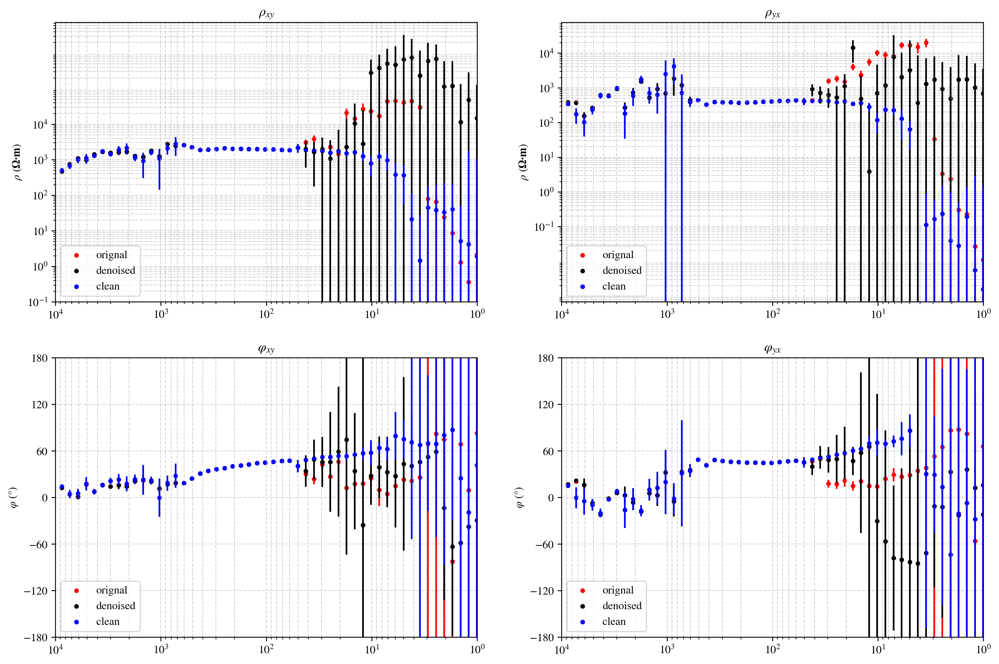

In [26]:
ftlist_one = ftlist_o # {'ftlist_o':ftlist_o,'ftlist_d':ftlist_d,'ftlist_c':ftlist_c} np.vstack((ftlist2_o,ftlist3_o,ftlist4_o))
Z_huber_one = {'Z_huber_o':Z_huber_o,'Z_huber_d':Z_huber_d,'Z_huber_c':Z_huber_c}
Zvar_one = {'Zvar_o':Zvar_o,'Zvar_d':Zvar_d,'Zvar_c':Zvar_c}

oneimage(ftlist_one,Z_huber_one,Zvar_one)

#  write2edi(denoised)

In [ ]:
from mtpy.core.mt import MT
import os
edi_file = "/home/enhuaj/data/AMT/{}/{}/阻抗估计/{}_before.edi".format(Province,site,file)
savepath = "/home/enhuaj/data/AMT/{}/{}/阻抗估计/".format(Province,site)
# Create an MT object
mt_obj = MT(edi_file)

In [ ]:
# 阻抗
mt_obj.Z.z[:,0,0] = Z_huber_d['Zxx'].squeeze()
mt_obj.Z.z[:,0,1].real,mt_obj.Z.z[:,0,1].imag = abs(mt_obj.Z.z[:,0,1].real),abs(mt_obj.Z.z[:,0,1].imag)
mt_obj.Z.z[:,1,0].real,mt_obj.Z.z[:,1,0].imag = abs(mt_obj.Z.z[:,1,0].real),abs(mt_obj.Z.z[:,1,0].imag)
mt_obj.Z.z[:,1,1] = Z_huber_d['Zyy'].squeeze()
# 误差
mt_obj.Z.z_err[:,0,0] = Zvar_d['xx'].squeeze()
mt_obj.Z.z_err[:,0,1] = Zvar_d['xy'].squeeze()
mt_obj.Z.z_err[:,1,0] = Zvar_d['yx'].squeeze()
mt_obj.Z.z_err[:,1,1] = Zvar_d['yy'].squeeze()
mt_obj.Z.freq = ftlist_d.squeeze()
# 写入edi文件
# mt_obj.write_mt_file(save_dir=savepath,fn_basename='{}_diff.edi'.format(file))